# Compare shift fit and empirical percentiles methods in GCMs : SI

Apply empirical percentile and shift fit method on all GCMs (for shift fit: 1950-2019 data and corresponding model GMST, same as in reanalysis), and compare the resulting nAHD for WBGT28.

Sensitivity test to method for calculation of nAHD. 

In [9]:
# necessary: netcdf4-python, regionmask, (xarray, geopandas), cartopy, openpyxl, statsmodels

import numpy as np
import pandas as pd
import os, glob, re 
import math
import xarray as xr
import geopandas as gpd
import regionmask as regionmask
import dask
import matplotlib.pyplot as plt
import netCDF4

%matplotlib inline

#plotting
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature



# import my variables settings functions from other scripts
from settings import *
from functions import *
from utils import *
from plotscript import *


sys.path.append('../dist_cov/dist_cov/')
from scipy.stats import norm
import distributions as distributions


In [10]:
cellarea = xr.open_dataarray(os.path.join(datadirs,'geo-information/clm45_area.nc4'))
figdir = os.path.join(figdirs, 'fig_feb26')


# Fxns

In [97]:
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec

def plot_map_nAHD(data_plot,
                    ax,
                    proj=ccrs.PlateCarree(),
                    vmin = -100,
                    vmax = 200, 
                    levels = 11,
                    title_label = None,
                  title=True, 
                  skew=True,
                  cmap = 'RdBu_r',
                  extend='both'
                  
            ):

    if isinstance(levels, int):
        levels = np.linspace(vmin, vmax, levels)

    if skew:
        cmap = LinearSegmentedColormap.from_list('new_RdBu_r', plt.get_cmap('RdBu_r')(np.linspace(0.25, 1, 192))) 
        norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)
    else:
        cmap = cmap
    crs = ccrs.PlateCarree()
    ax.set_extent([-179.75, 179.75, -60, 90], crs=ccrs.PlateCarree())

    # plot
    plot = data_plot.plot(vmin=vmin, vmax=vmax, cmap=cmap, transform=crs, levels=levels, extend=extend, add_colorbar=False, ax=ax)
    ax.coastlines(color='black', linewidth=0.8)
    if title:
        try: 
            ax.set_title(f'{data_plot.dataset.values} \n{round(data_plot.min().values, 0)}, {round(data_plot.max().values,0)}, {round(data_plot.mean().values,0)}')
        except:
            ax.set_title(f'{data_plot.model.values} \n{data_plot.min().values.round(0)}, {data_plot.max().values.round(0)}, {data_plot.mean().values.round(0)}')
    else:
        ax.set_title('')
            
    ax.set_title(title_label, loc='left',fontweight='bold')

    return plot 

In [12]:
import numpy as np

def rmse_weighted(a, b, cellarea=cellarea, mask=True):
    """
    Calculates RMSE between a forecast, a, and an observation, b, 
    with area weighting using cellarea.
    """
    if mask:
        cellarea = cellarea * landmask
        a = a * landmask
        b = b * landmask 
    weighted_squared_errors = cellarea * (a - b) ** 2
    return np.sqrt(np.sum(weighted_squared_errors) / np.sum(cellarea))

def mae_weighted(a, b, cellarea=cellarea, mask=True):
    """
    Calculates mean absolute error between a and b, 
    with area weighting using cellarea.
    """
    if mask:
        cellarea = cellarea * landmask
        a = a * landmask
        b = b * landmask 
    weighted_absolute_errors = cellarea * np.abs(a - b)
    return np.sum(weighted_absolute_errors) / np.sum(cellarea)

def bias_weighted(a, b, cellarea=cellarea, mask=True):
    """
    Calculates mean bias between a and b, 
    with area weighting using cellarea.
    """
    if mask:
        cellarea = cellarea * landmask
        a = a * landmask
        b = b * landmask 
    weighted_errors = cellarea * (a - b)
    return np.sum(weighted_errors) / np.sum(cellarea)


In [13]:
def rmse(a,b):
    """
    calculates RMSE between a forecast, a, and an observation, b

    """
    return(np.sqrt(np.mean((a - b)**2)))

def mae(a, b):
    """
    Calculates mean absolute error between a and b, 
    """
    return np.mean(np.abs(a - b))

def bias(a, b):
    """
    Calculates mean absolute error between a and b, 
    """
    return np.mean(a - b)

def skewness(x):
    """
    Calculate skewness of x (1-D array).
    """
    return np.mean(((x - np.mean(x))/np.std(x))**3)

# 1) Total difference models EP vs. reanalysis SF

### 1) open reanalysis shift fit results

In [14]:
dir_shift_fit = 'forster2024-hitol-nan'
start_year = 1950
datasets=datasets[0:3]
datasets

['GSWP3-W5E5', '20CRv3-ERA5', '20CRv3-W5E5']

In [15]:
# open data
flags['models']='ISIMIP3a'
dirname = 'output_shift-fit' 

da_list = []

for i in range(len(datasets)):
    dataset = datasets[i]
    filepath = glob.glob(os.path.join(outdirs, 
                                      f'{dirname}/{dir_shift_fit}/WBGT/ISIMIP3a/{dataset}/*_obsclim_WBGT_params_shift_loc_mon_{start_year}_2019.nc'))[0]
    da = xr.open_dataarray(filepath).expand_dims("dataset").assign_coords(dataset=("dataset", [dataset]))
    da_list.append(da)
    da_params = xr.concat(da_list, dim="dataset")

# covariate
gmst_smo = get_gmst_smo(ntime=4, observed_warming_path=observed_warming_path_annual)



In [16]:
# calc nAHD
threshold = 28
da_nAHD_obs, da_nAHD_mo, da_p0, da_p1 = calc_nAHD_shift_fit(da_params, threshold, gmst_smo,year_pres=2023,GWI=1.3)


In [17]:
# calc p1
days_in_month = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
days_in_month_da = xr.DataArray(days_in_month, dims=['month'], coords={'month': da_p1['month']})
da_p1_obs = (da_p1 * days_in_month_da).sum(dim='month')
da_p0_obs = (da_p0 * days_in_month_da).sum(dim='month')

### 2) Open EP data from models 

In [18]:
dirname='output_empirical'
models='ISIMIP3b'

year=2023

da_nAHD_mod_emp = open_all_nAHD(GCMs,  metric='WBGT28', outdirname=dirname, year_pres=year)
da_p0_models_emp, da_p1_models_emp = open_all_p0_p1(GCMs, metric='WBGT28', outdirname=dirname, year_pres=year) 

## 2) plot EP - reanalysis sf 

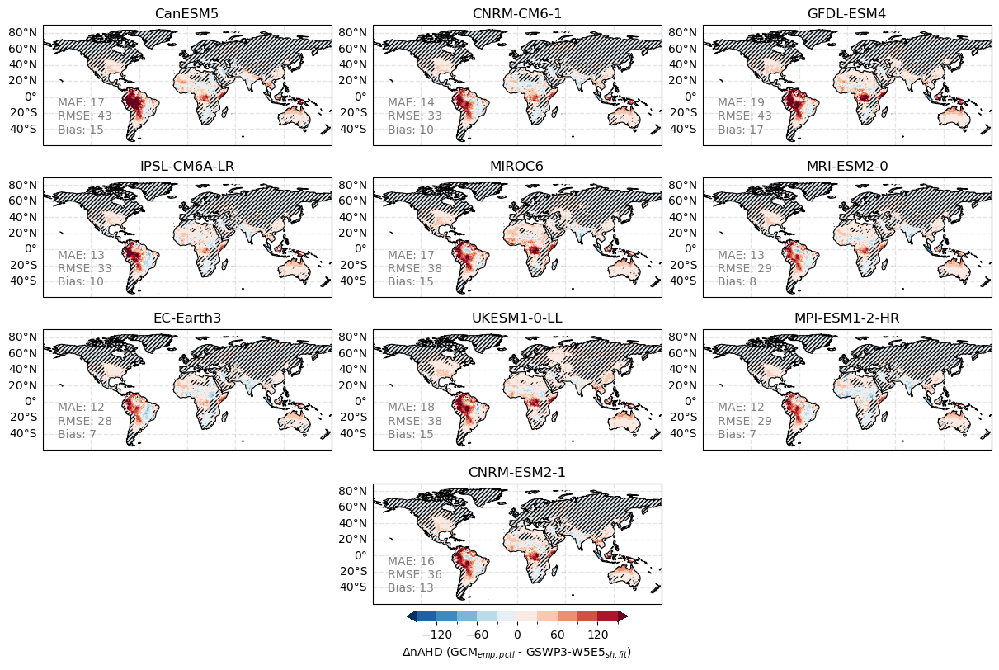

In [ ]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax = -150,150
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(4,3, figsize=(12,8),  layout='constrained',subplot_kw={'projection': crs}, sharey=True)
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( np.concatenate((axes[:len(GCMs)-1], [axes[-2]])) ):
    if i >= 10:
        break

    data1=da_nAHD_mod_emp.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cbar = fig.colorbar(plot, ax=ax, location='bottom', shrink=1, fraction=0.08)
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

# Remove the two empty subplots
for ax in (axes[-3], axes[-1]):
    ax.remove()

#fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin1.png'),dpi=300)

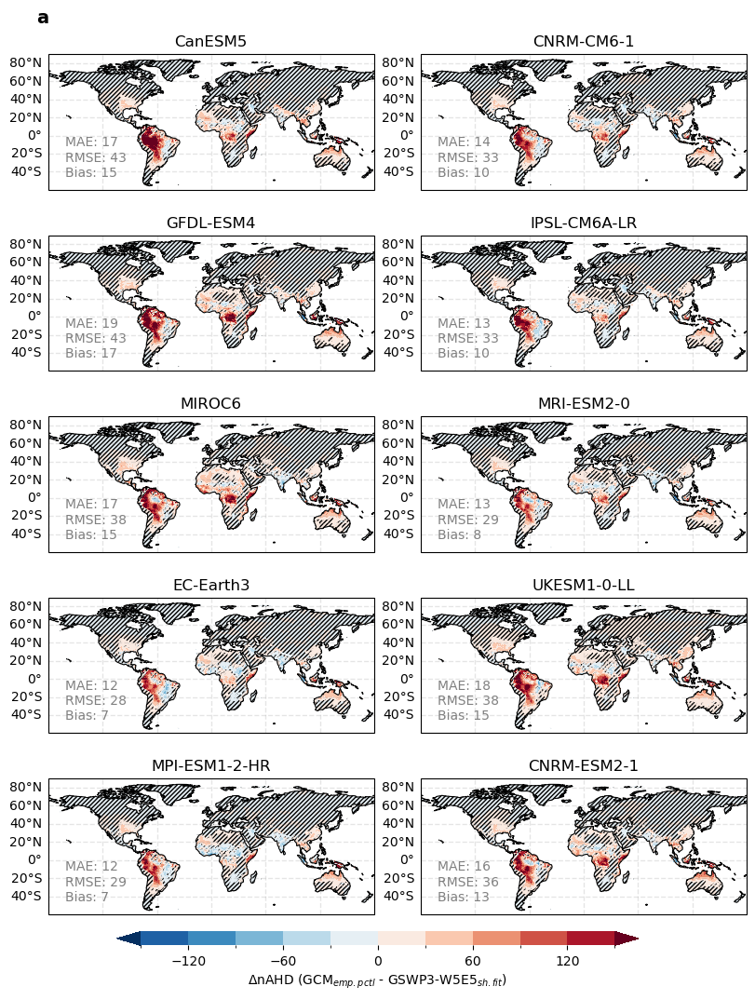

In [20]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax = -150,150
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_nAHD_mod_emp.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

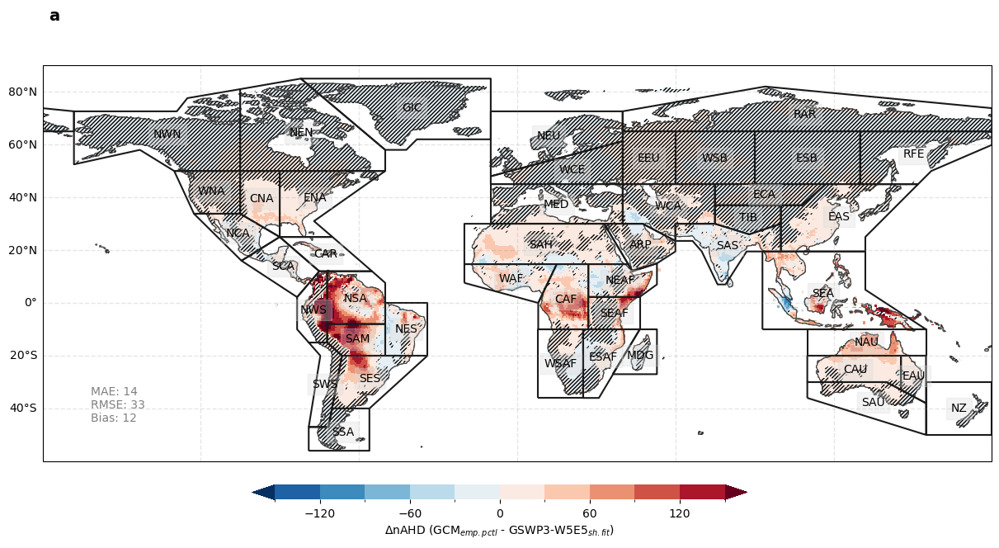

In [364]:
# plot MMM 

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=150
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, ax = plt.subplots(figsize=(12,6),layout='constrained',subplot_kw={'projection': crs})

dataset=0

data1=da_nAHD_mod_emp.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )

# stippling - delete this to have without significance assessment
sig = np.abs(data_plot) > 2
# hatch = n.s.
sig_inv = ~sig
cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

ar6_land = regionmask.defined_regions.ar6.land
ar6_plot = ar6_land.plot(label="abbrev")

# Loop over all text objects in the axes
for txt in ar6_plot.texts:
    if txt.get_bbox_patch() is not None:
        txt.get_bbox_patch().set_alpha(0.3)  # 0 = fully transparent, 1 = opaque

# calc statistics 
rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

ax.text(.05,.1, 
    f"MAE: {int(mae.values.round(0))}\n"
    f"RMSE: {int(rmse.values.round(0))}\n"
    f"Bias: {int(bias.values.round(0))}" ,
    transform=ax.transAxes,
    c='gray')

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=1, color='gray', alpha=0.2, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.25, 0, 0.5, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);

High difference in NW South America, North South America, South American Monsoon, Central Africa (Congo), Horn of Africa, Northern Australia and South East Asia 

Less in Central North America, East Asia, Australia

Underestimations in Sahel, Eastern Amazon, South Asia, Persian Gulf, Southern Africa, Western Indonesia 

## 3) zonal average

In [22]:
da_diff_total = ( da_nAHD_mod_emp - da_nAHD_obs.isel(dataset=dataset) ) * landmask

da_zonal = da_diff_total.mean(dim='lon')

df_zonal = da_zonal.to_pandas().T  # rows = models, columns = lat


<Axes: xlabel='lat'>

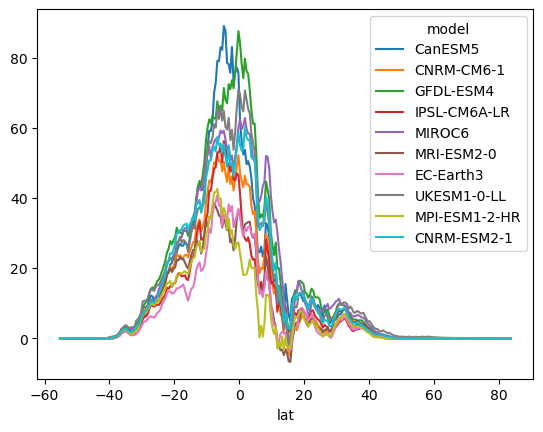

In [23]:
df_zonal.plot()

In [24]:
df = df_zonal

df_binned = (
    df
    .groupby((df.index // 10) * 10)
    .mean()
)

df_summary = df_binned.agg(['mean', 'median', 'std', 'min', 'max'], axis=1).round(1).sort_index(ascending=False)

df_summary
#90-80, 80-70.... -80- -90

,mean,median,std,min,max
lat,,,,,
80.0,-0.0,-0.0,0.0,-0.0,-0.0
70.0,0.0,-0.0,0.0,-0.0,0.0
60.0,-0.0,-0.0,0.0,-0.0,0.1
50.0,0.0,-0.0,0.1,-0.1,0.4
40.0,0.7,0.6,0.5,0.2,1.9
30.0,5.3,5.2,1.6,3.4,8.1
20.0,5.9,5.9,2.7,2.7,9.8
10.0,7.9,8.5,5.2,0.7,15.4
0.0,35.7,35.7,14.3,13.7,55.9


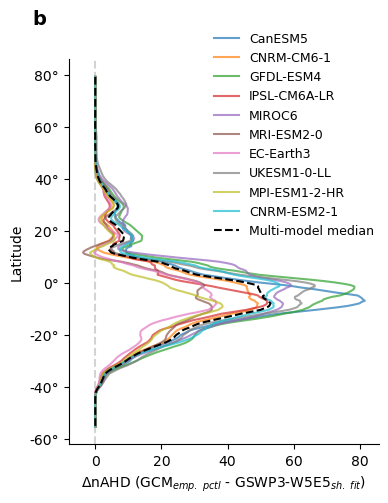

In [25]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(4, 5))

ax.axvline(0, ls='--', c='lightgray')

for col in df.columns:
    ax.plot(
        df[col].rolling(10).mean().values,  # x = zonal mean
        df.index.values,                    # y = latitude
        label=col,
        alpha=.7
    )

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='k', ls='--')

ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM$_{emp.\ pctl}$ - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False, fontsize=9, bbox_to_anchor=(1.02, 1.1))
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


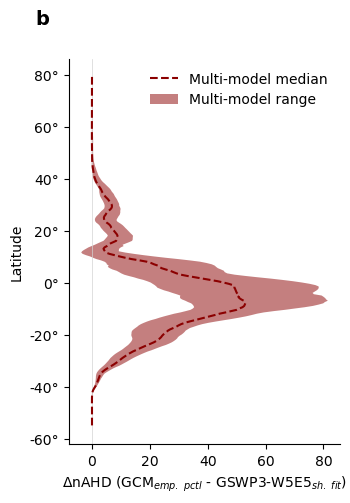

In [26]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='darkred', ls='--')

# ax.fill_betweenx(df.index.values, 
#                 df.min(axis=1).rolling(10).mean().values,
#                 df.max(axis=1).rolling(10).mean().values
#                 )
ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                label='Multi-model range'
            
                )

ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM$_{emp.\ pctl}$ - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


## v2) with probabilities

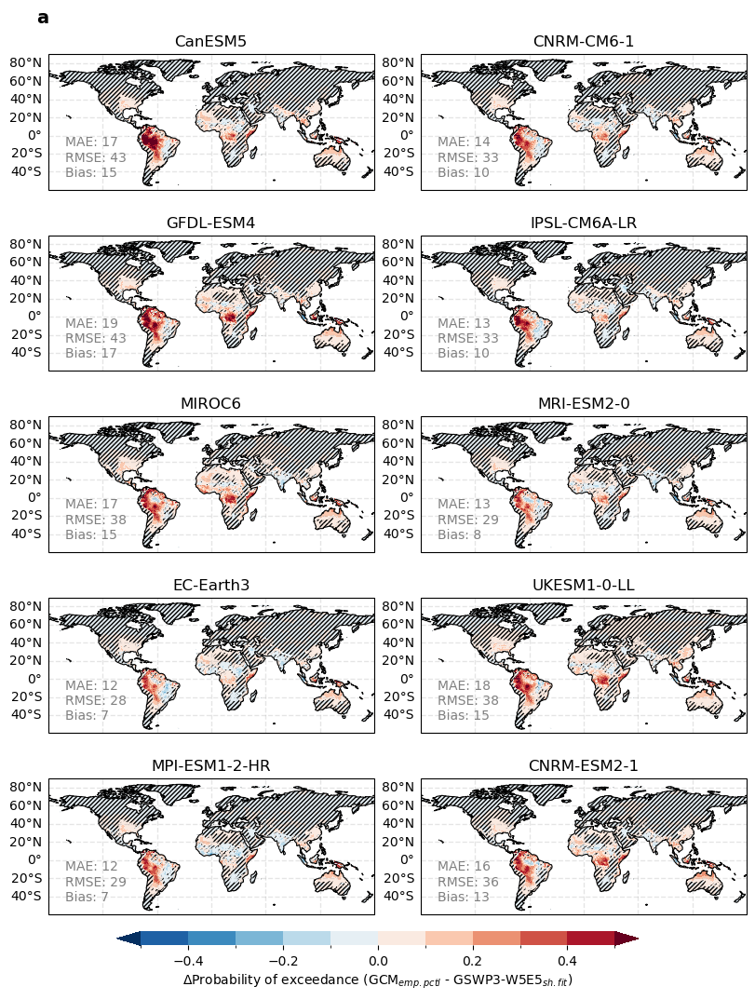

In [27]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax = -.5,.5
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_nAHD_mod_emp.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( ( data1 - data2 ) * landmask ) / 365

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > (5/365)
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$Probability of exceedance (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

In [28]:
5/365

0.0136986301369863

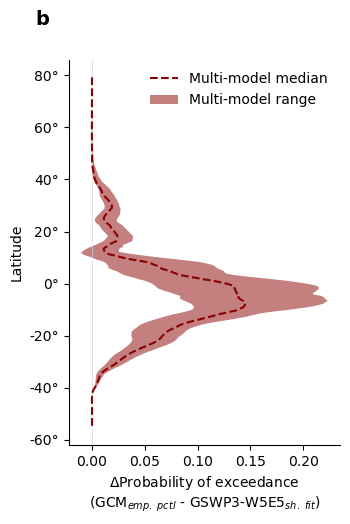

In [29]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values / 365, 
        df.index.values,
        label='Multi-model median', 
        c='darkred', ls='--')

# ax.fill_betweenx(df.index.values, 
#                 df.min(axis=1).rolling(10).mean().values,
#                 df.max(axis=1).rolling(10).mean().values
#                 )
ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1) / 365,
                df.rolling(10).mean().values.max(axis=1) / 365,
                color='darkred',
                alpha=.5,
                edgecolor=None,
                label='Multi-model range'
            
                )

ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$Probability of exceedance'+ '\n(GCM$_{emp.\ pctl}$ - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


In [30]:
(df_summary / 365).round(3)

,mean,median,std,min,max
lat,,,,,
80.0,-0.000,-0.000,0.000,-0.000,-0.000
70.0,0.000,-0.000,0.000,-0.000,0.000
60.0,-0.000,-0.000,0.000,-0.000,0.000
50.0,0.000,-0.000,0.000,-0.000,0.001
40.0,0.002,0.002,0.001,0.001,0.005
30.0,0.015,0.014,0.004,0.009,0.022
20.0,0.016,0.016,0.007,0.007,0.027
10.0,0.022,0.023,0.014,0.002,0.042
0.0,0.098,0.098,0.039,0.038,0.153


#### only where min difference is 5: similar 

In [31]:
da_diff = ( da_nAHD_mod_emp - da_nAHD_obs.isel(dataset=dataset) ) * landmask

da_diff_5 = da_diff.where(np.abs(da_diff) > 5 , 0 ) * landmask
da_zonal_5 = da_diff_5.mean(dim='lon')
df_5 = da_zonal_5.to_pandas().T  # rows = models, columns = lat


In [32]:
da_diff_5

<xarray.DataArray (model: 10, lat: 360, lon: 720)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * model    (model) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'
    dataset  <U11 'GSWP3-W5E5'

# 2) Difference due to method

## 1) Calc nAHD (shift fit) from GCMs

In [83]:
flags['models']='ISIMIP3b'

model_years = calc_warming_periods_models(GCMs, dir_gmst_models, observed_warming_path, target_year=2023, method='ar6', match='closest', windowsize=0)[['year']]
model_years

,year
model,
CanESM5,2009
CNRM-CM6-1,2025
GFDL-ESM4,2035
IPSL-CM6A-LR,2012
MIROC6,2038
MRI-ESM2-0,2024
EC-Earth3,2017
UKESM1-0-LL,2022
MPI-ESM1-2-HR,2024


In [84]:

dirname = 'output_shift-fit' 
start_year=1950 
dir_shift_fit = 'forster2024-hitol-nan'

da_list = []

for i in range(len(GCMs)):
    GCM = GCMs[i]
    filepath = glob.glob(os.path.join('/data/brussel/vo/000/bvo00012/vsc10419/attr-hw/output', 
                                      f'output_shift-fit/{dir_shift_fit}/WBGT/ISIMIP3b/{GCM}/*_WBGT_params_shift_loc_mon_{start_year}_2019.nc'))[0]
    da = xr.open_dataarray(filepath).expand_dims("dataset").assign_coords(dataset=("dataset", [GCM]))
    da_list.append(da)
    
    da_params_mod = xr.concat(da_list, dim="dataset") #loc sigma long

In [85]:
da_params_mod

# plot b1 to compare with reanalysis

<xarray.DataArray 'fit_params' (dataset: 10, month: 12, lat: 360, lon: 720,
                                params: 3)>
array([[[[[-2.49495439e+01, -1.48788528e-01,  5.50431205e+00],
          [-2.49464177e+01, -1.62544655e-01,  5.51231098e+00],
          [-2.49111824e+01, -2.54900166e-01,  5.51338040e+00],
          ...,
          [-2.49424435e+01, -1.61727472e-01,  5.51187089e+00],
          [-2.48951176e+01, -2.71800819e-01,  5.51553799e+00],
          [-2.49002269e+01, -2.76439931e-01,  5.52299847e+00]],

         [[-2.62064202e+01,  1.59506695e+00,  5.59353930e+00],
          [-2.62116750e+01,  1.58327947e+00,  5.59022359e+00],
          [-2.61947629e+01,  1.53320707e+00,  5.59509524e+00],
          ...,
          [-2.61960200e+01,  1.57601237e+00,  5.60484772e+00],
          [-2.61606000e+01,  1.51249646e+00,  5.59961934e+00],
          [-2.61682188e+01,  1.52201227e+00,  5.61156215e+00]],

         [[-2.80240138e+01,  4.24847041e+00,  5.82878187e+00],
          [-2.80336099e+01,  4.25774125e+00,  5.82894115e+00],
          [-2.80249053e+01,  4.24946995e+00,  5.84480631e+00],
          ...,
...
          ...,
          [-2.90897799e+01,  1.25391182e+00,  2.96778916e+00],
          [-2.90810408e+01,  1.25123265e+00,  2.96541372e+00],
          [-2.90760265e+01,  1.25393690e+00,  2.97193890e+00]],

         [[-2.98247780e+01,  2.01730641e+00,  3.03147379e+00],
          [-2.98234018e+01,  2.02029360e+00,  3.02571728e+00],
          [-2.98099813e+01,  2.01662382e+00,  3.03117110e+00],
          ...,
          [-2.98486018e+01,  2.02079339e+00,  3.02911596e+00],
          [-2.98345994e+01,  2.01607679e+00,  3.03425128e+00],
          [-2.98308584e+01,  2.01777341e+00,  3.02648146e+00]],

         [[-2.91713019e+01,  6.33416266e-01,  3.06128507e+00],
          [-2.91699130e+01,  6.27534401e-01,  3.06300241e+00],
          [-2.91613319e+01,  6.36188337e-01,  3.06140488e+00],
          ...,
          [-2.91869426e+01,  6.26858758e-01,  3.06510796e+00],
          [-2.91768676e+01,  6.29320512e-01,  3.06381035e+00],
          [-2.91784647e+01,  6.27432459e-01,  3.06456049e+00]]]]])
Coordinates:
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * params   (params) object 'b0' 'b1' 'sigma'
  * dataset  (dataset) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

In [86]:
df_gmst_mod = merge_model_gmst(GCMs, dir_gmst_models)
df_gmst_mod_smo = df_gmst_mod.apply(lambda col: apply_lowess(col, df_gmst_mod.index, ntime=4))
df_gmst_mod_smo

,CanESM5,CNRM-CM6-1,GFDL-ESM4,IPSL-CM6A-LR,MIROC6,MRI-ESM2-0,EC-Earth3,UKESM1-0-LL,MPI-ESM1-2-HR,CNRM-ESM2-1
year,,,,,,,,,,
1850,0.081839,0.075265,-0.116804,-0.163789,-0.073311,0.073341,-0.082681,-0.062625,-0.005754,0.124842
1851,-0.027388,0.041693,-0.073870,-0.071802,-0.082864,0.061162,0.002303,-0.021973,0.078604,0.188433
1852,-0.087118,0.024950,-0.009374,-0.008409,-0.066935,0.019337,-0.004756,0.035597,0.199157,0.173887
1853,-0.054830,0.025412,-0.004595,0.037362,0.026333,-0.047268,-0.075239,0.064067,0.104657,0.095709
1854,-0.061384,0.024409,-0.085900,0.065928,0.191804,-0.040739,-0.128356,0.021006,0.010157,-0.000254
...,...,...,...,...,...,...,...,...,...,...
2096,6.125161,4.733954,3.435702,5.299199,3.125304,3.779781,4.628006,5.891278,3.618147,4.389936
2097,6.248846,4.811054,3.459183,5.345967,3.036804,3.785240,4.909858,5.991796,3.622728,4.476962
2098,6.367561,4.867603,3.484327,5.373768,3.152982,3.818553,4.805906,6.082378,3.681728,4.505526


In [87]:
da_gmst_mod_smo = xr.DataArray(df_gmst_mod_smo, dims=["year", "dataset"])
da_gmst_mod_smo

<xarray.DataArray (year: 251, dataset: 10)>
array([[ 8.18385606e-02,  7.52653566e-02, -1.16803937e-01, ...,
        -6.26250237e-02, -5.75406827e-03,  1.24841837e-01],
       [-2.73882100e-02,  4.16930991e-02, -7.38702660e-02, ...,
        -2.19726135e-02,  7.86039936e-02,  1.88432923e-01],
       [-8.71176935e-02,  2.49502816e-02, -9.37445239e-03, ...,
         3.55972060e-02,  1.99156863e-01,  1.73886868e-01],
       ...,
       [ 6.36756093e+00,  4.86760265e+00,  3.48432657e+00, ...,
         6.08237760e+00,  3.68172836e+00,  4.50552561e+00],
       [ 6.42160200e+00,  4.94912916e+00,  3.50987447e+00, ...,
         6.16692271e+00,  3.75405663e+00,  4.53140591e+00],
       [ 6.44054136e+00,  5.02312720e+00,  3.52502444e+00, ...,
         6.29646687e+00,  3.81341471e+00,  4.55568526e+00]])
Coordinates:
  * year     (year) int64 1850 1851 1852 1853 1854 ... 2096 2097 2098 2099 2100
  * dataset  (dataset) object 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

In [88]:
model_years

,year
model,
CanESM5,2009
CNRM-CM6-1,2025
GFDL-ESM4,2035
IPSL-CM6A-LR,2012
MIROC6,2038
MRI-ESM2-0,2024
EC-Earth3,2017
UKESM1-0-LL,2022
MPI-ESM1-2-HR,2024


In [89]:
da_years = xr.DataArray(model_years, dims=["dataset", "year"]).squeeze()
da_years

<xarray.DataArray (dataset: 10)>
array([2009, 2025, 2035, 2012, 2038, 2024, 2017, 2022, 2024, 2030],
      dtype=object)
Coordinates:
  * dataset  (dataset) object 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'
    year     <U4 'year'

In [90]:
da_nAHD_mod_sf, da_nAHD_mo_mod_sf, da_p0_mod_sf, da_p1_mod_sf = calc_nAHD_shift_fit(da_params_mod, threshold=28, gmst_smo=da_gmst_mod_smo,year_pres=da_years,GWI=1.3)

da_nAHD_mod_sf = da_nAHD_mod_sf.rename({'dataset':'model'})

In [91]:
da_nAHD_mod_sf

<xarray.DataArray (model: 10, lat: 360, lon: 720)>
array([[[-1.03089276e-18, -1.41233387e-18, -5.03346214e-18, ...,
         -9.87100016e-19, -4.88553086e-18, -4.82454016e-18],
        [ 2.46682448e-18,  2.21737229e-18,  4.11982138e-18, ...,
          2.22871212e-18,  4.25749580e-18,  4.30411567e-18],
        [ 7.79288724e-16,  7.54123043e-16,  6.85633626e-16, ...,
          7.45663780e-16,  6.83419303e-16,  6.06238695e-16],
        ...,
        [ 3.03848302e-34,  2.07366156e-34,  1.23894370e-34, ...,
          1.67990585e-34,  1.11701526e-34,  8.88159645e-35],
        [ 1.03161617e-39,  5.24072834e-40,  7.00488601e-40, ...,
          1.58536858e-39,  1.39748338e-39,  7.21363969e-40],
        [-1.70738381e-40, -1.69309553e-40, -2.03510761e-40, ...,
         -1.58867536e-40, -3.25584023e-40, -3.65126071e-40]],

       [[ 2.14184896e-16,  2.96310592e-16,  2.16731537e-16, ...,
          2.89074812e-16,  2.10197787e-16,  2.96102522e-16],
        [ 8.04892308e-12,  7.67221802e-12,  8.27442246e-12, ...,
          7.56413031e-12,  7.91613607e-12,  7.64354146e-12],
        [ 6.86014137e-14,  6.79503634e-14,  6.89377175e-14, ...,
          5.91895827e-14,  6.49084845e-14,  6.32739907e-14],
...
        [ 2.25376237e-33,  2.71126680e-33,  2.21024780e-33, ...,
          1.38582258e-33,  1.90752437e-33,  2.07539641e-33],
        [ 1.54501347e-33,  1.22335199e-33,  1.46720437e-33, ...,
          1.67987067e-33,  1.60383996e-33,  1.35998708e-33],
        [-3.05453533e-35, -2.61185118e-35, -2.81212887e-35, ...,
         -2.72974008e-35, -3.04592533e-35, -2.54736937e-35]],

       [[ 7.39174248e-16,  9.67224939e-16,  7.66469151e-16, ...,
          9.43564350e-16,  7.28824093e-16,  9.27002040e-16],
        [ 6.45090116e-11,  6.41325446e-11,  6.55932626e-11, ...,
          6.18698764e-11,  6.42312282e-11,  6.28263509e-11],
        [ 3.99333074e-13,  4.04861100e-13,  4.16598427e-13, ...,
          3.69000425e-13,  3.77822159e-13,  3.88945337e-13],
        ...,
        [ 5.32330705e-34,  6.85009156e-34,  6.78790517e-34, ...,
          5.45915420e-34,  5.12639418e-34,  5.96943599e-34],
        [ 6.51905930e-31,  7.46833237e-31,  6.83287715e-31, ...,
          6.63323251e-31,  6.21872448e-31,  7.16030743e-31],
        [ 1.27564621e-35,  1.47244543e-35,  1.52118501e-35, ...,
          1.17523633e-35,  1.30173724e-35,  1.26980258e-35]]])
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * model    (model) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

In [92]:
da_p0_mod_sf

<xarray.DataArray (dataset: 10, month: 12, lat: 360, lon: 720)>
array([[[[3.23984906e-022, 3.72445108e-022, 3.98732768e-022, ...,
          3.72317878e-022, 4.24447467e-022, 4.76659982e-022],
         [2.02182885e-022, 1.89125577e-022, 2.10163063e-022, ...,
          2.48462236e-022, 2.40089804e-022, 2.89793594e-022],
         [5.99066458e-022, 5.91769091e-022, 7.70349546e-022, ...,
          6.70818356e-022, 8.15446223e-022, 8.32136351e-022],
         ...,
         [1.40729668e-079, 9.22992244e-080, 4.88092645e-080, ...,
          4.52595248e-080, 6.65217351e-080, 4.04058422e-080],
         [2.20354392e-077, 1.50015603e-077, 2.14290482e-077, ...,
          3.42587597e-077, 8.23797301e-077, 2.58503713e-077],
         [3.14929102e-072, 2.85228523e-072, 2.69296980e-071, ...,
          4.92252123e-072, 1.76871382e-071, 1.32118001e-071]],

        [[9.42806172e-028, 1.30216564e-027, 1.88348772e-027, ...,
          2.00578717e-027, 2.15955901e-027, 2.11183708e-027],
         [6.23332515e-026, 6.17805459e-026, 6.31414648e-026, ...,
          9.77189825e-026, 8.23939420e-026, 8.67848301e-026],
         [1.18417302e-022, 1.12666332e-022, 1.44497915e-022, ...,
          1.49055409e-022, 1.67820753e-022, 1.54468351e-022],
...
         [5.62664139e-042, 4.01996526e-042, 6.51812605e-042, ...,
          4.96038821e-042, 5.04809013e-042, 3.74157304e-042],
         [6.41508029e-037, 5.08252880e-037, 6.23962608e-037, ...,
          5.96203794e-037, 6.60341798e-037, 5.01765608e-037],
         [3.30210806e-043, 6.84326623e-043, 3.41089409e-043, ...,
          7.05113600e-043, 3.47371296e-043, 7.07388405e-043]],

        [[1.75880885e-022, 1.56030265e-022, 1.69085999e-022, ...,
          1.47805647e-022, 1.63044564e-022, 1.57084244e-022],
         [3.10017179e-026, 3.88335371e-026, 2.82271800e-026, ...,
          4.59962825e-026, 3.40042105e-026, 4.40179063e-026],
         [1.20631147e-025, 1.11935443e-025, 1.08840577e-025, ...,
          1.35612524e-025, 1.23209642e-025, 1.17441374e-025],
         ...,
         [1.60028346e-082, 3.90409805e-082, 1.76641126e-082, ...,
          1.80441386e-082, 1.41809296e-082, 3.30372123e-082],
         [5.88763937e-081, 2.98127806e-081, 6.22995644e-081, ...,
          3.82700472e-081, 7.70923117e-081, 3.11391763e-081],
         [5.39864662e-078, 6.60173098e-078, 5.82495383e-078, ...,
          7.55808045e-078, 6.94309093e-078, 7.48104842e-078]]]])
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * dataset  (dataset) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

In [93]:
days_in_month = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
days_in_month_da = xr.DataArray(days_in_month, dims=['month'], coords={'month': da_p1_mod_sf['month']})

da_p1_mod_sf_year = (da_p1_mod_sf * days_in_month_da).sum(dim='month')
da_p1_mod_sf_year = da_p1_mod_sf_year.rename({'dataset':'model'})

In [94]:
da_p0_mod_sf_year = (da_p0_mod_sf * days_in_month_da).sum(dim='month')
da_p0_mod_sf_year = da_p0_mod_sf_year.rename({'dataset':'model'})

## 2) Plot SF

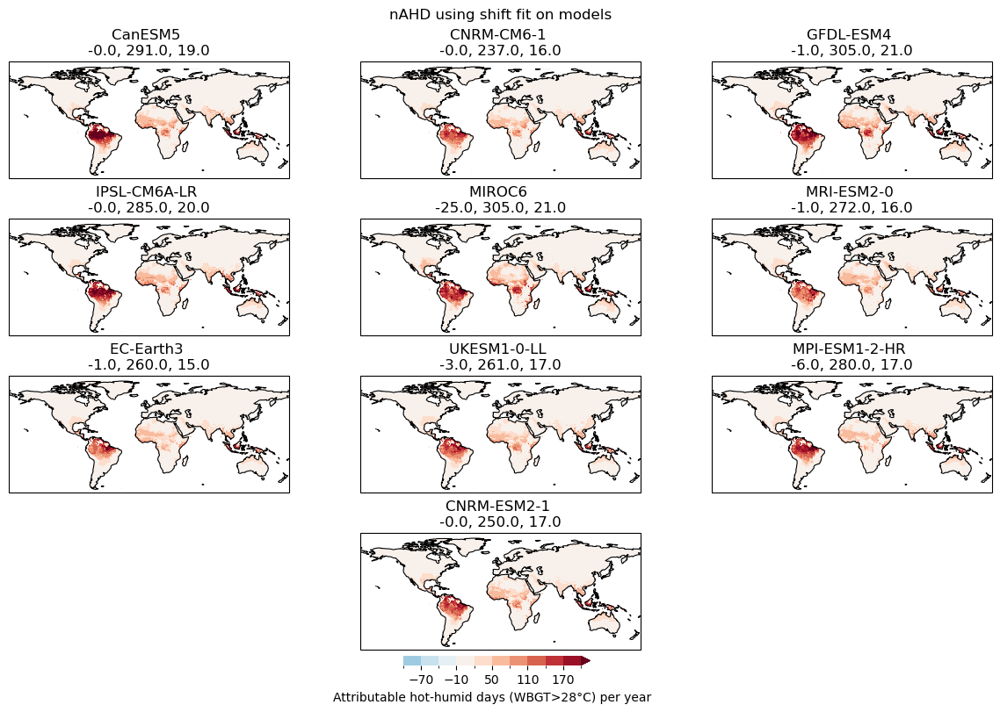

In [95]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax, levels = -100, 200, np.linspace(-100, 200, 16) # standard in fxn 
#titles = [f"{letter}" for letter in string.ascii_lowercase[:13]]

# Create figure layout
fig = plt.figure(figsize=(12,8), layout='constrained')
gs = gridspec.GridSpec(4, 6, figure=fig)


# Plot model data
for i in range(4):
    for j in range(3):
        if i*3 + j > 8: break
        ax = fig.add_subplot(gs[i, j*2:j*2+2], projection=proj)
        data_plot = da_nAHD_mod_sf.isel(model=i*3+j) * landmask
        plot_map_nAHD(data_plot,
                  ax, 
                  #title_label=titles[3 + (i-1)*3 + j],
                     )

# Extra model subplot
ax = fig.add_subplot(gs[3, 2:4], projection=proj)
data_plot = da_nAHD_mod_sf.isel(model=9) * landmask
plot = plot_map_nAHD(data_plot,
                  ax,
                  #title_label=titles[-1],
             )

# Colorbar
cbar = fig.colorbar(plot, extend='max', ax=ax, location='bottom', shrink=1, fraction=0.08)
cbar.set_label('Attributable hot-humid days (WBGT>28°C) per year', )
cbar.outline.set_edgecolor('none')

fig.suptitle('nAHD using shift fit on models');

## 3) Compare nAHD from models using emp. pctl vs. using shift fit

### Plot difference

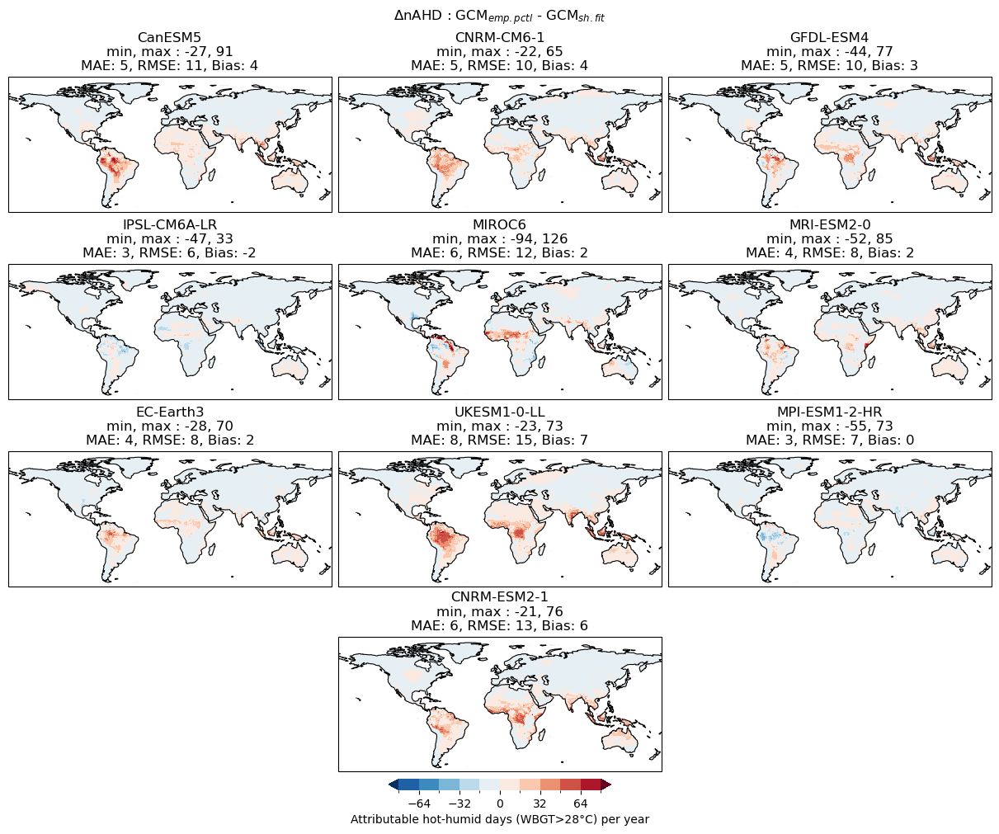

In [98]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax = -80,80
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

# Create figure layout
fig = plt.figure(figsize=(12,10), layout='constrained')
gs = gridspec.GridSpec(4, 6, figure=fig)



# Plot model data
for i in range(4):
    for j in range(3):
        if i*3 + j > 8: break
        ax = fig.add_subplot(gs[i, j*2:j*2+2], projection=proj)
        data1=da_nAHD_mod_emp.isel(model=i*3+j)
        data2=da_nAHD_mod_sf.isel(model=i*3+j)
        data_plot = ( data1 - data2 ) * landmask
        plot_map_nAHD(data_plot,
                  ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                     )
        ax.set_title(
            f"{data_plot.model.values}\n"
            f"min, max : {int(data_plot.min().values.round(0))}, {int(data_plot.max().values.round(0))}\n"
            f"MAE: {int(mae_weighted(data1, data2).values.round(0))}, "
            f"RMSE: {int(rmse_weighted(data1, data2).values.round(0))}, "
            f"Bias: {int(bias_weighted(data1, data2).values.round(0))}"
        )

# Extra model subplot
ax = fig.add_subplot(gs[3, 2:4], projection=proj)
data1=da_nAHD_mod_emp.isel(model=9)
data2=da_nAHD_mod_sf.isel(model=9)
data_plot = ( data1  - data2) * landmask
plot = plot_map_nAHD(data_plot,
                  ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
             )
ax.set_title(
    f"{data_plot.model.values}\n"
    f"min, max : {int(data_plot.min().values.round(0))}, {int(data_plot.max().values.round(0))}\n"
    f"MAE: {int(mae_weighted(data1, data2).values.round(0))}, "
    f"RMSE: {int(rmse_weighted(data1, data2).values.round(0))}, "
    f"Bias: {int(bias_weighted(data1, data2).values.round(0))}"
)
# Colorbar
cbar = fig.colorbar(plot, ax=ax, location='bottom', shrink=1, fraction=0.08)
cbar.set_label('Attributable hot-humid days (WBGT>28°C) per year', )
cbar.outline.set_edgecolor('none')

fig.suptitle('$\Delta$nAHD : GCM$_{emp. pctl}$ - GCM$_{sh. fit}$');

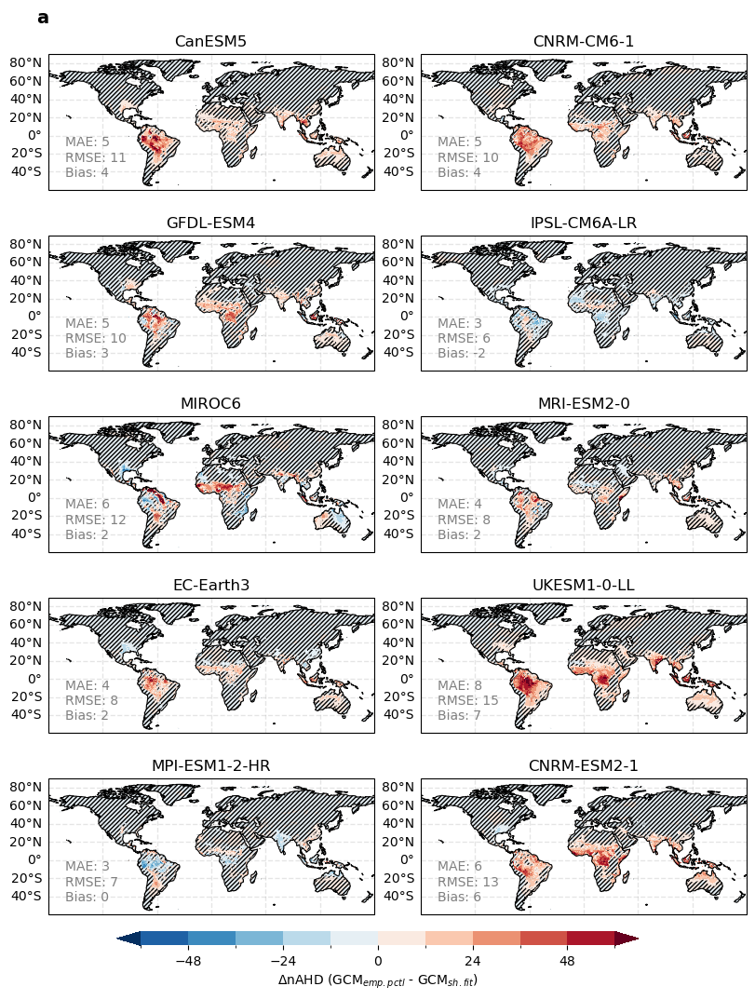

In [99]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=60
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break
    
    data1=da_nAHD_mod_emp.isel(model=i)
    data2=da_nAHD_mod_sf.isel(model=i)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+'GCM$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_emp_vs_shf_long.png'),dpi=300)

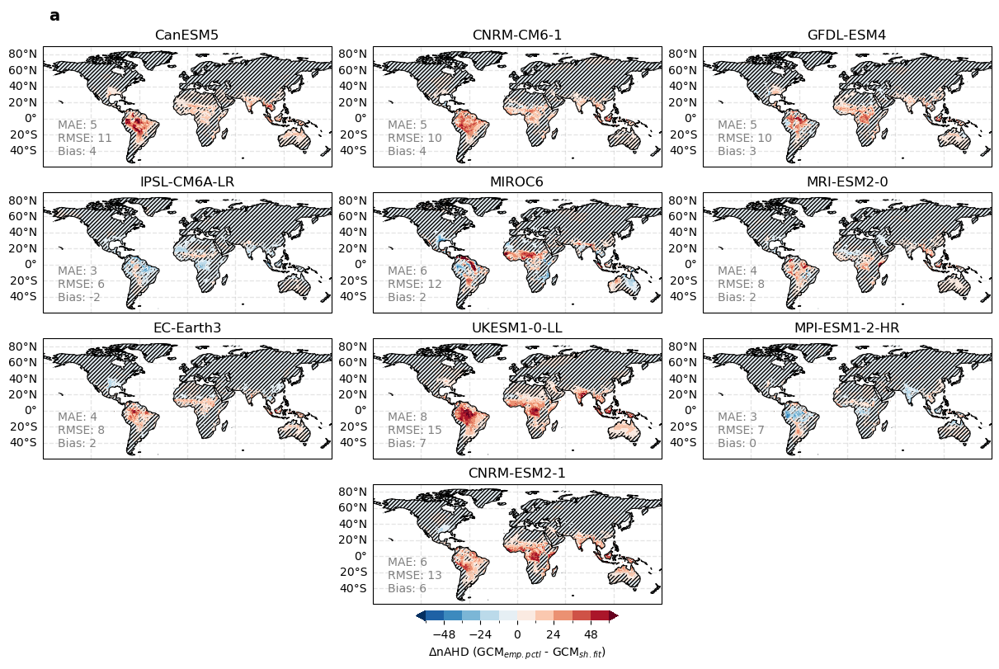

In [100]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=60
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(4,3, figsize=(12,8),  layout='constrained',subplot_kw={'projection': crs}, sharey=True)
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( np.concatenate((axes[:len(GCMs)-1], [axes[-2]])) ):
    if i >= 10:
        break

    data1=da_nAHD_mod_emp.isel(model=i)
    data2=da_nAHD_mod_sf.isel(model=i)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cbar = fig.colorbar(plot, ax=ax, location='bottom', shrink=1, fraction=0.08)
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+'GCM$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

# Remove the two empty subplots
for ax in (axes[-3], axes[-1]):
    ax.remove()

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_emp_vs_shf_wide.png'),dpi=300)

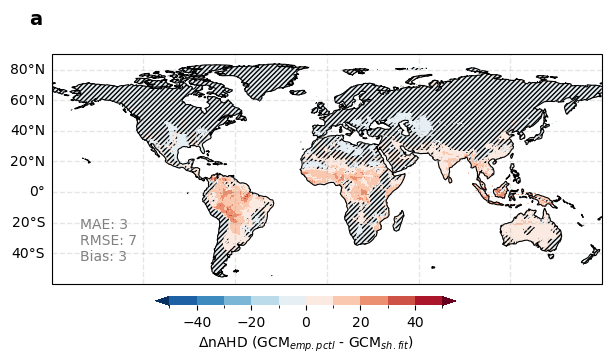

In [101]:
# plot MMM 

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=50
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, ax = plt.subplots(figsize=(6,3),layout='constrained',subplot_kw={'projection': crs})

dataset=0

data1=da_nAHD_mod_emp.mean(dim='model')
data2=da_nAHD_mod_sf.mean(dim='model')
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )

# stippling - delete this to have without significance assessment
sig = np.abs(data_plot) > 1
# hatch = n.s.
sig_inv = ~sig
cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                

# calc statistics 
rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

ax.text(.05,.1, 
    f"MAE: {int(mae.values.round(0))}\n"
    f"RMSE: {int(rmse.values.round(0))}\n"
    f"Bias: {int(bias.values.round(0))}" ,
    transform=ax.transAxes,
    c='gray')

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=1, color='gray', alpha=0.2, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.25, 0, 0.5, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+'GCM$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);

<Axes: xlabel='lat'>

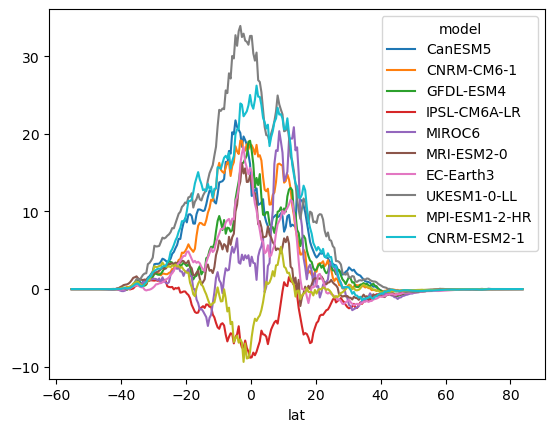

In [102]:
da_diff_method = ( da_nAHD_mod_emp - da_nAHD_mod_sf ) * landmask

da_zonal_method = da_diff_method.mean(dim='lon')

df_method = da_zonal_method.to_pandas().T  # rows = models, columns = lat

df_method.plot()


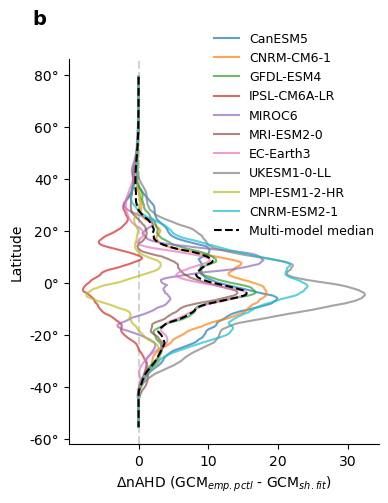

In [103]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(4, 5))

ax.axvline(0, ls='--', c='lightgray')

df = df_method

for col in df.columns:
    ax.plot(
        df[col].rolling(10).mean().values,  # x = zonal mean
        df.index.values,                    # y = latitude
        label=col,
        alpha=.7
    )

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='k', ls='--')

ax.set_ylabel(r'Latitude')
ax.set_xlabel('$\Delta$nAHD (GCM$_{emp. pctl}$ - '+'GCM$_{sh. fit}$)')

ax.legend(frameon=False, fontsize=9, bbox_to_anchor=(1.02, 1.1))
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


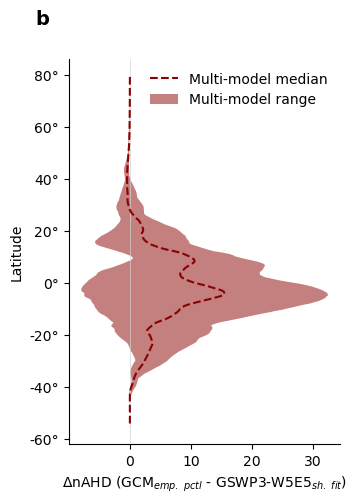

In [104]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='darkred', ls='--')

# ax.fill_betweenx(df.index.values, 
#                 df.min(axis=1).rolling(10).mean().values,
#                 df.max(axis=1).rolling(10).mean().values
#                 )
ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                label='Multi-model range'
            
                )

ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM$_{emp.\ pctl}$ - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


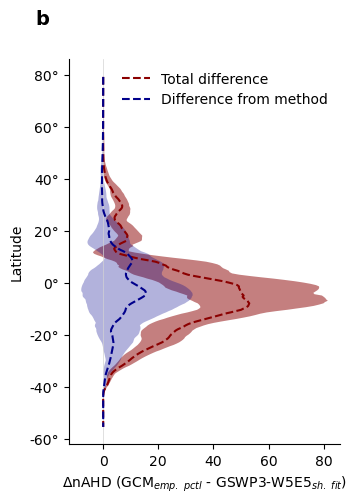

In [105]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')


# MMM
df = df_zonal 
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Total difference', 
        c='darkred', ls='--')

# ax.fill_betweenx(df.index.values, 
#                 df.min(axis=1).rolling(10).mean().values,
#                 df.max(axis=1).rolling(10).mean().values
#                 )
ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                #label='Multi-model range'
                )

df = df_method
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Difference from method', 
        c='darkblue', ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='darkblue',
        alpha=.3,
        edgecolor=None,
        #label='Multi-model range'
        )


ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM$_{emp.\ pctl}$ - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


# I could do this as barplots! like IPCC contribution to warming 


### Notes 

In general, method explains part of the difference found between models and observational results, with estimates on average higher in EP than SF (figure above is calculated over all land grid cells).

In some models/locations the estimate from EP is actually lower than from SF

When looking at the % difference explained, we look only at pixels where difference models vs. obs was of at least 5 nAHD, see below



## 3) plot distribution of bias and scatterplot

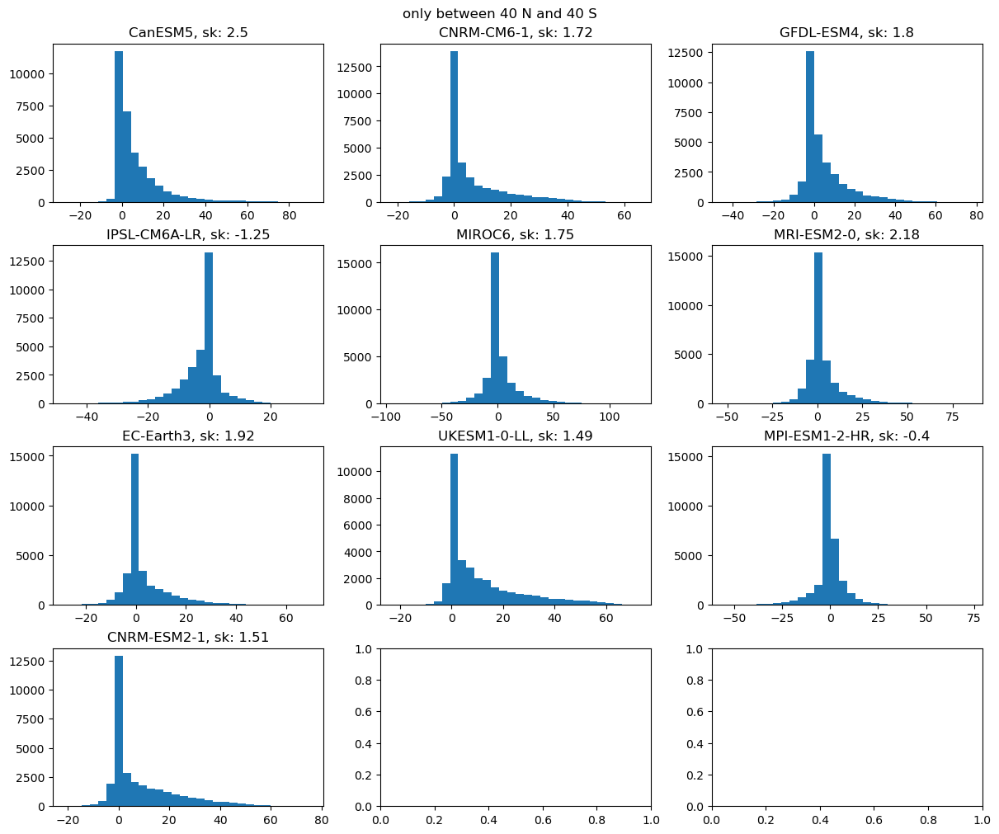

In [106]:
from scipy.stats import skew

fig, axes = plt.subplots(4,3, figsize=(12,10), layout='constrained')

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i > 9: break
    data_plot = ( da_nAHD_mod_emp.isel(model=i) - da_nAHD_mod_sf.isel(model=i) ).sel(lat=slice(40,-40)) * landmask
    data_skew = skew(data_plot.values.flatten(),nan_policy='omit')

    data_plot.plot.hist(ax=ax, bins=30)
    ax.set_title(f'{data_plot.model.values}, sk: {round(data_skew,2)}')



fig.suptitle('only between 40 N and 40 S');

#Fisher-Pearson coefficient of skewness https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.skew.html

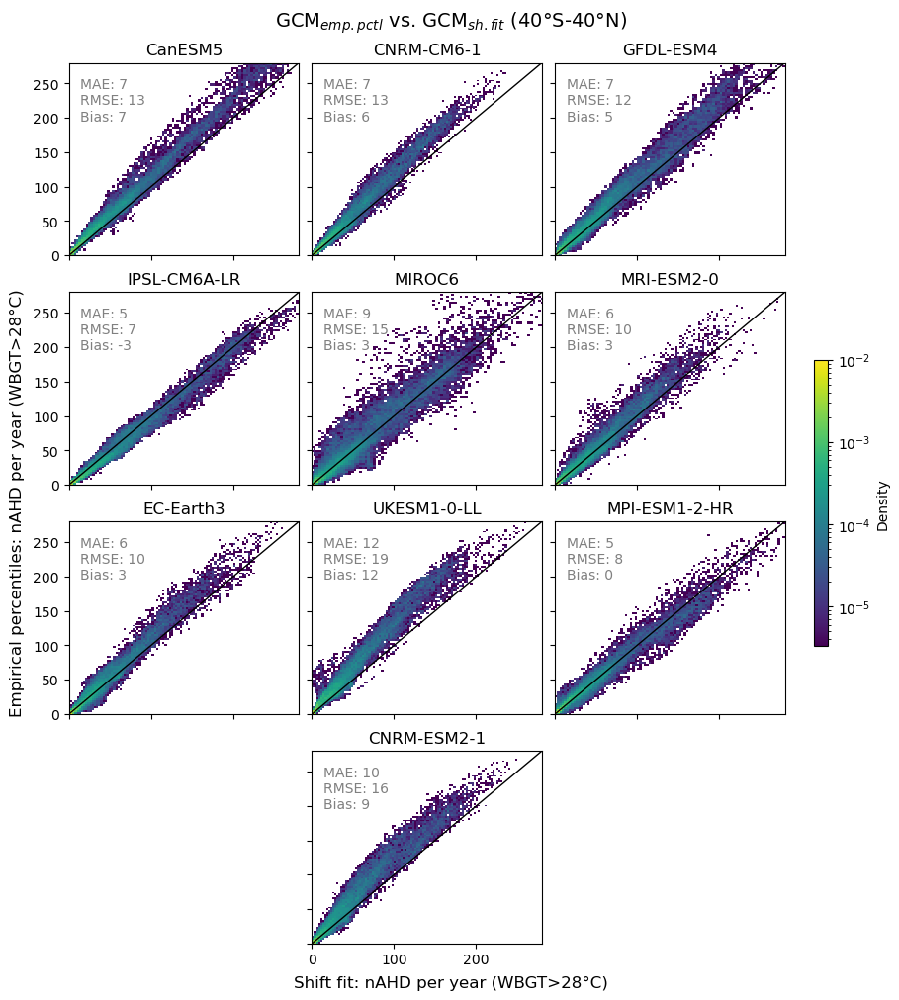

In [107]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors

fig, axes = plt.subplots(4, 3, figsize=(9, 10), constrained_layout=True, sharex=True, sharey=True)
axes = axes.flatten()
vmax = .01

# Collect all histograms for shared colorbar scaling
hist_data = []

cellarea_sel = cellarea.sel(lat=slice(40, -40))

# Plot data on the first 10 axes, ignore the last two
for i, ax in enumerate( np.concatenate((axes[:len(GCMs)-1], [axes[-2]])) ):
    if i >= 10:
        break
    data1 = da_nAHD_mod_sf.isel(model=i).sel(lat=slice(40, -40)) * landmask
    data2 = da_nAHD_mod_emp.isel(model=i).sel(lat=slice(40, -40)) * landmask
    
    x = data1.values.flatten()
    y = data2.values.flatten()
    xy = np.column_stack([x, y])
    xy = xy[~np.isnan(xy).any(axis=1)]
    
    h = ax.hist2d(xy[:, 0], xy[:, 1], bins=100, density=True, norm=colors.LogNorm(vmax=vmax) )
    hist_data.append(h[3])  # Store the mappable object for colorbar scaling

    ax.axline((0, 0), slope=1, color='k', linewidth=1)
    ax.set_title(f'{da_nAHD_mod_emp.isel(model=i).model.values.item()}')
    ax.set_ylim([0,280])
    ax.set_xlim([0,280])
    ax.text(.05,.7, 
            f"MAE: {int(mae_weighted(data2, data1, cellarea_sel ).values.round(0))}\n"
            f"RMSE: {int(rmse_weighted(data2, data1, cellarea_sel).values.round(0))}\n"
            f"Bias: {int(bias_weighted(data2, data1, cellarea_sel).values.round(0))}" ,
            transform=ax.transAxes,
            c='gray')

# Add a single colorbar shared across all subplots
cbar = fig.colorbar(hist_data[0], ax=axes[:len(GCMs)], orientation="vertical", fraction=0.02, pad=0.04)
cbar.set_label('Density')

# Remove the two empty subplots
for ax in (axes[-3], axes[-1]):
    ax.remove()

fig.suptitle('GCM$_{emp. pctl}$ vs. GCM$_{sh. fit}$ (40°S-40°N)',fontsize=14)
fig.supxlabel('Shift fit: nAHD per year (WBGT>28°C)')
fig.supylabel('Empirical percentiles: nAHD per year (WBGT>28°C) ');


#plt.savefig(os.path.join(figdir,'figSI11_modeleval_sf_ep.pdf'),dpi=300,transparent=True)
#plt.savefig(os.path.join(figdir,'figSI11_modeleval_sf_ep.png'),dpi=300,transparent=True)



Comparing model results using empirical percentiles vs. using shift fit on models, agreement is not bad. In some models, bias is low and centered on zero, suggesting the two methods give similar results given the same data. In other models, the bias is right-skewed, with empirical percentiles giving larger nAHD values. This suggests the shift fit method could underestimate the attributable signal. But this is not the case across all models thus seems not to be totally systematic. 


## 4) what % of difference is due to method

In [108]:
da_diff_total

<xarray.DataArray (model: 10, lat: 360, lon: 720)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * model    (model) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'
    dataset  <U11 'GSWP3-W5E5'

In [109]:
da_diff_method

<xarray.DataArray (model: 10, lat: 360, lon: 720)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * model    (model) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

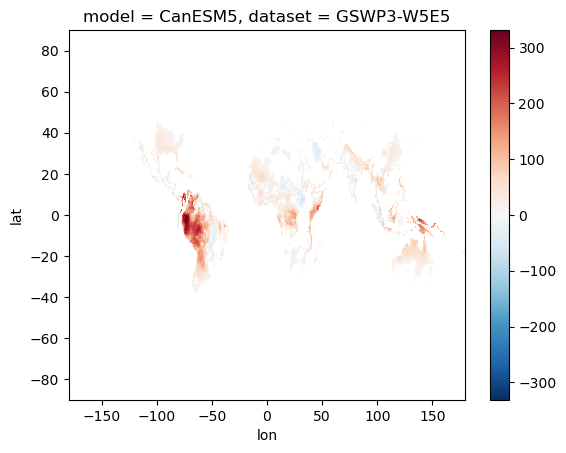

In [110]:
da_diff_total.isel(model=0).where(np.abs(da_diff_total.isel(model=0)) >5).plot()

# look only where absolute difference is at least five days

In [226]:
da_diff_to_explain = da_diff_total.where(np.abs(da_diff_total)>5) # only where difference is at least 1 days

da_diff_explained = da_diff_method / da_diff_to_explain # fraction of difference explained



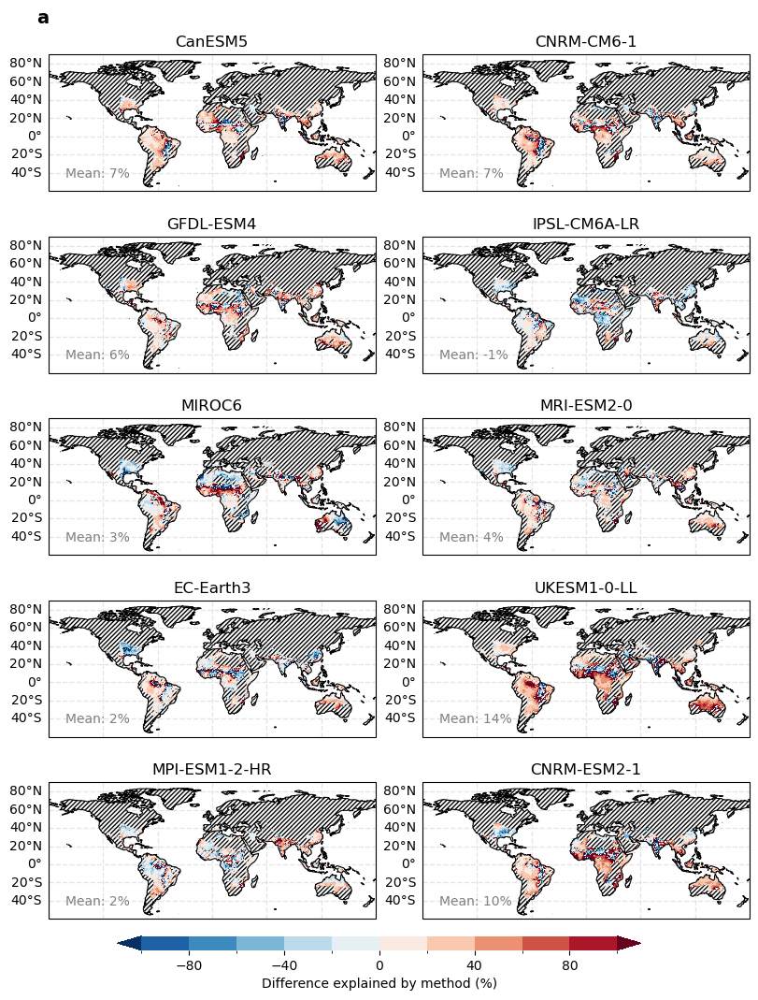

In [227]:

#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_diff_total.isel(model=i)
    data2=da_diff_explained.isel(model=i)
    data_plot = data2 * landmask * 100

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, extend='both'
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data1) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

    # calc statistics 
    # area weighted mean of explained difference
    bias= bias_weighted(data2, 0, cellarea=cellarea, mask=True) * 100

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"Mean: {int(bias.round(0))}%" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('Difference explained by method (%)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

Note: mean is calcualated only over grid cells where difference is at least 5 days. Generally higher in EP, but in some places also underestimations

>Neg % difference explained = different sign

>Pos % difference explained = part of diff is explained

>more than 100% explained = difference between methods larger than between GCM and obs

<Axes: xlabel='lat'>

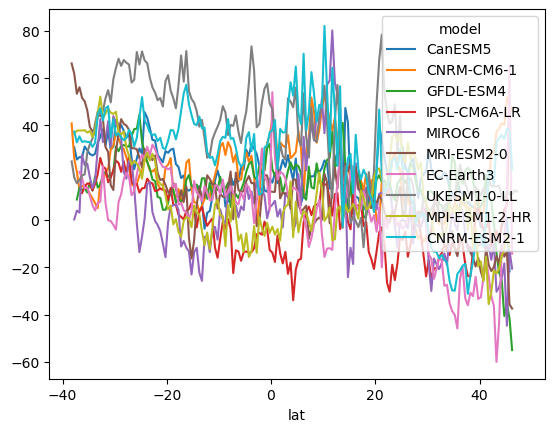

In [228]:
df_percent_diff_explained_zonal = da_diff_explained.mean(dim='lon').to_pandas().T * 100
df_percent_diff_explained_zonal.plot()

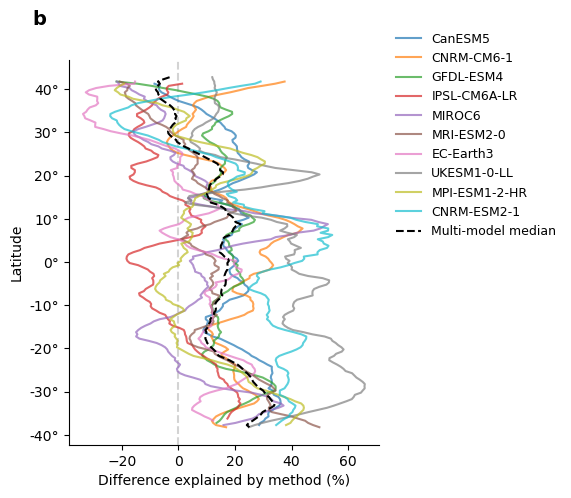

In [229]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(4, 5))

ax.axvline(0, ls='--', c='lightgray')

df = df_percent_diff_explained_zonal

for col in df.columns:
    ax.plot(
        df[col].rolling(10).mean().values,  # x = zonal mean
        df.index.values,                    # y = latitude
        label=col,
        alpha=.7
    )

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='k', ls='--')

ax.set_ylabel(r'Latitude')
ax.set_xlabel('Difference explained by method (%)')

ax.legend(frameon=False, fontsize=9, bbox_to_anchor=(1.02, 1.1))
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


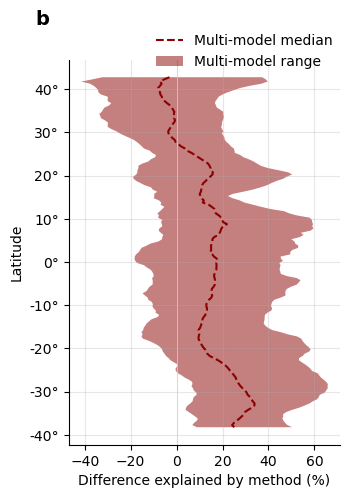

In [115]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='darkred', ls='--')

ax.fill_betweenx(df.index.values, 
                df.min(axis=1).rolling(10).mean().values,
                df.max(axis=1).rolling(10).mean().values,
                color='darkred',
                alpha=.5,
                edgecolor=None,
                label='Multi-model range'
                )
# ax.fill_betweenx(df.index.values, 
#                 df.rolling(10).mean().values.min(axis=1),
#                 df.rolling(10).mean().values.max(axis=1),
#                 color='darkred',
#                 alpha=.5,
#                 edgecolor=None,
#                 label='Multi-model range'
#                 )

ax.set_ylabel(r'Latitude')
ax.set_xlabel('Difference explained by method (%)')

ax.legend(frameon=False, loc=1, bbox_to_anchor=(1.02, 1.1))
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
plt.grid(alpha=.3)


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


In [116]:
df.median(axis=1).mean()

13.108729231333268

In [117]:
df.median(axis=1).rolling(10).mean().loc[20:-20].max()

21.9052101218925

In [118]:
df.median(axis=1).rolling(10).mean().loc[-20:-40].max()

33.974221369216465

method explains part of the differnce at lower latitudes and in SH. 

On average the multi-model median explains 13% of the difference globally, where >5 days difference. 

Does not explain differences 90N - 30 N (neg precentage)

Explains generally less than 20% ... More numbers!



In [119]:
df = df_percent_diff_explained_zonal

df_binned = (
    df
    .groupby((df.index // 10) * 10)
    .mean()
)

df_summary = df_binned.agg(['median', 'min', 'max'], axis=1).round(0).sort_index(ascending=False)

df_summary

,median,min,max
lat,,,
80.0,NaN,NaN,NaN
70.0,NaN,NaN,NaN
60.0,NaN,NaN,NaN
50.0,NaN,NaN,NaN
40.0,-11.0,-20.0,30.0
30.0,-5.0,-28.0,14.0
20.0,11.0,-12.0,30.0
10.0,17.0,2.0,29.0
0.0,18.0,-8.0,46.0


## Compare p0 and p1 

In [120]:
# da_p0_models_emp, da_p1_models_emp, da_p1_obs, da_p0_obs

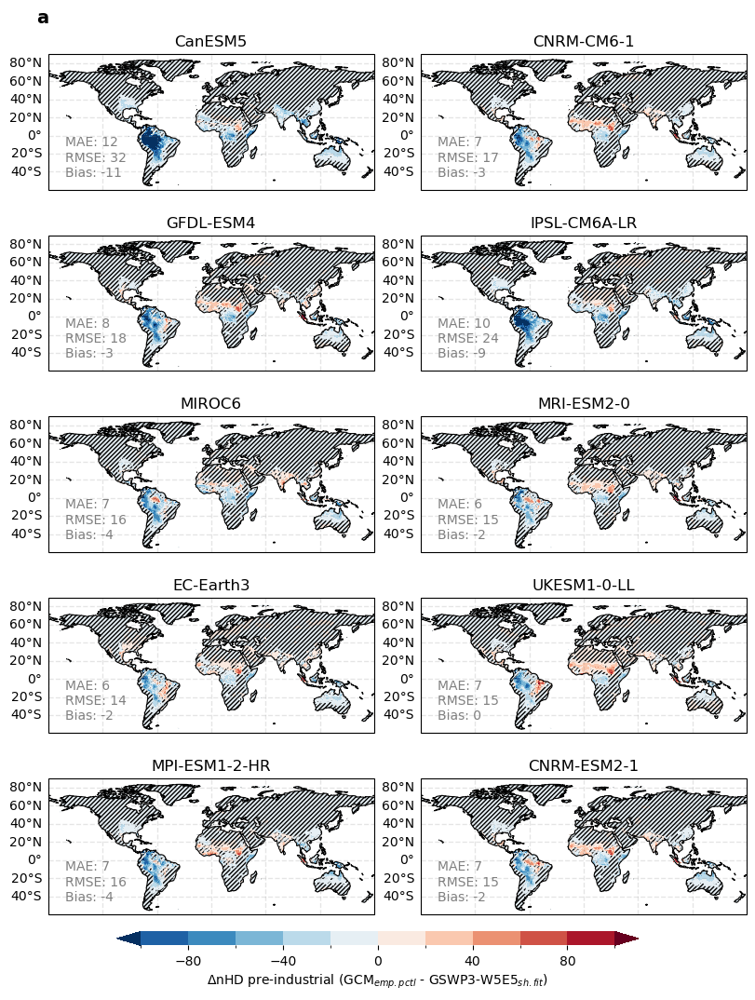

In [121]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_p0_models_emp.isel(model=i) * 365
    data2=da_p0_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nHD pre-industrial (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

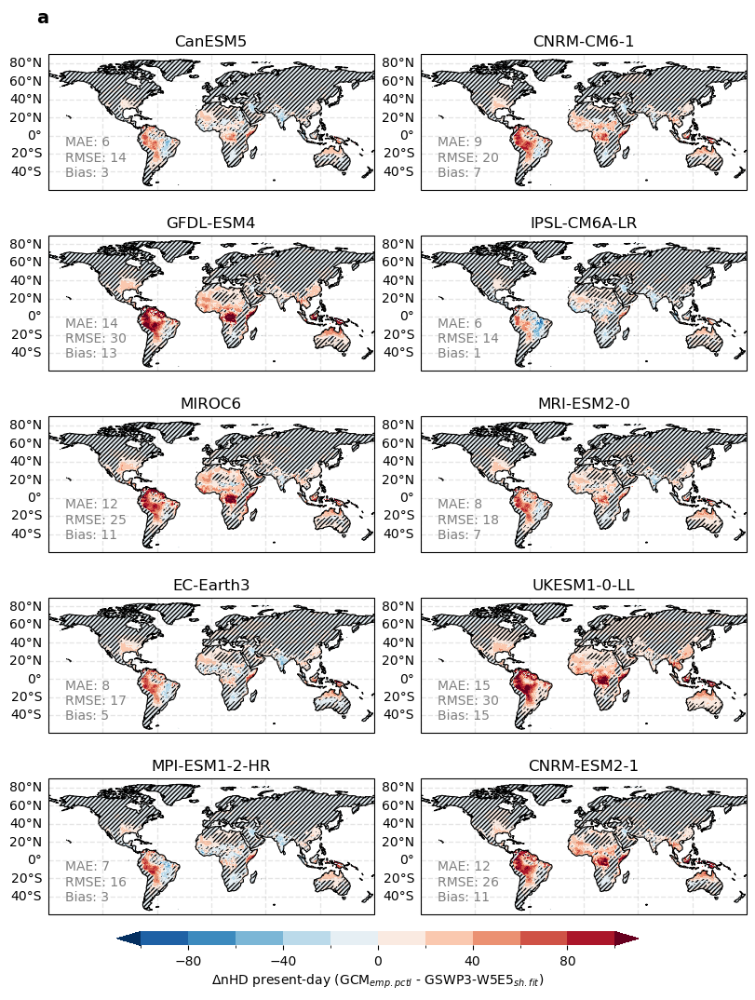

In [122]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_p1_models_emp.isel(model=i) * 365
    data2=da_p1_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nHD present-day (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

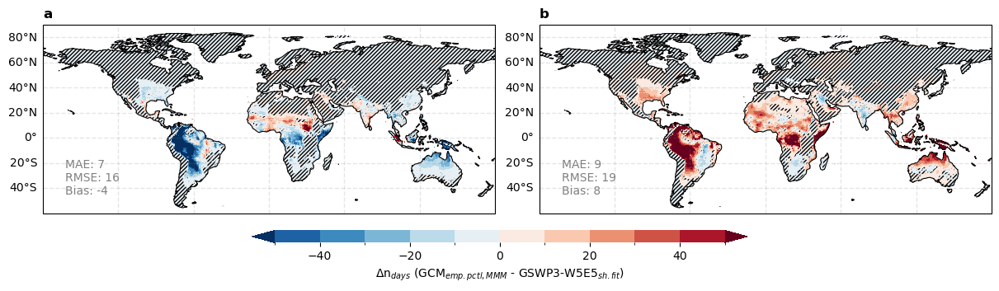

In [123]:
# plot MMM 

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=50
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 
titles=['a', 'b']

fig, axes = plt.subplots(1,2,figsize=(12,3),layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for ax, data1, data2, tit in zip(
    axes,
    [da_p0_models_emp, da_p1_models_emp],
    [da_p0_obs, da_p1_obs],
    titles
):

    data1=data1.mean(dim='model') * 365
    data2=data2.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                    )

    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(tit, fontweight='bold', loc='left')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.25, 0, 0.5, 0.05])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$n$_{days}$ (GCM$_{emp. pctl, MMM}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')


# 5) Difference not due to method: GCM SF - Reanalysis SF

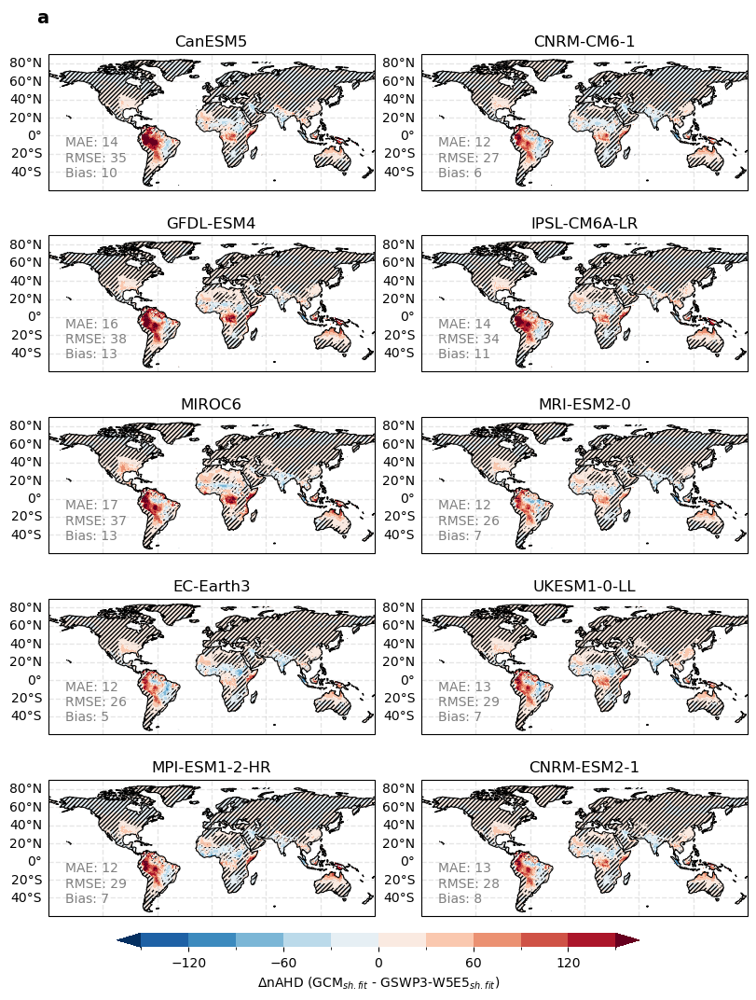

In [124]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmin, vmax = -150,150
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_nAHD_mod_sf.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

<Axes: xlabel='lat'>

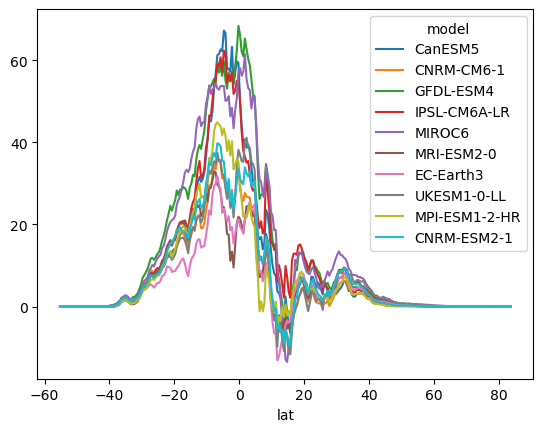

In [125]:
da_diff_sf = ( da_nAHD_mod_sf - da_nAHD_obs.isel(dataset=dataset) ) * landmask

df_zonal_sf = da_diff_sf.mean(dim='lon').to_pandas().T  # rows = models, columns = lat

df_zonal_sf.plot()

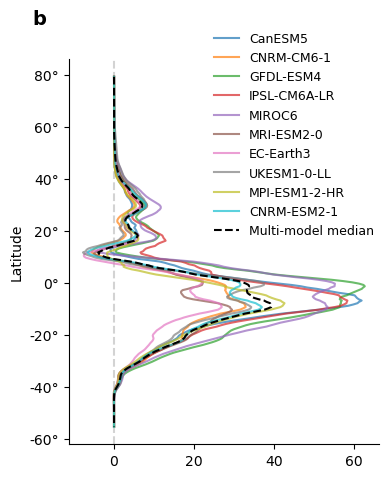

In [126]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(4, 5))

ax.axvline(0, ls='--', c='lightgray')

df = df_zonal_sf

for col in df.columns:
    ax.plot(
        df[col].rolling(10).mean().values,  # x = zonal mean
        df.index.values,                    # y = latitude
        label=col,
        alpha=.7
    )

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='k', ls='--')

ax.set_ylabel(r'Latitude')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )

ax.legend(frameon=False, fontsize=9, bbox_to_anchor=(1.02, 1.1))
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


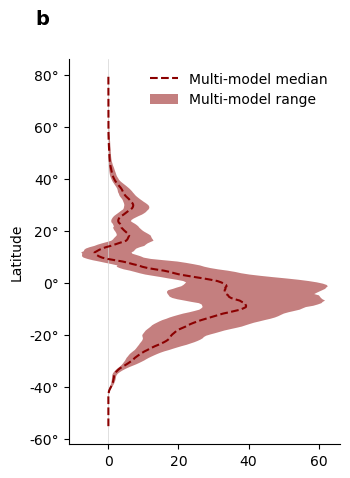

In [127]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')

# MMM
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Multi-model median', 
        c='darkred', ls='--')

# ax.fill_betweenx(df.index.values, 
#                 df.min(axis=1).rolling(10).mean().values,
#                 df.max(axis=1).rolling(10).mean().values
#                 )
ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                label='Multi-model range'
            
                )

ax.set_ylabel(r'Latitude')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


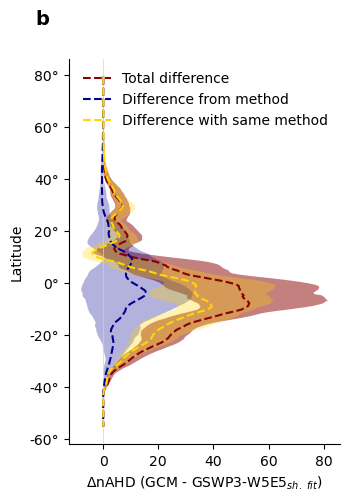

In [128]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')



# total difference
df = df_zonal 
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Total difference', 
        c='darkred', ls='--')

ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                )

# due to method
df = df_method
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Difference from method', 
        c='darkblue', ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='darkblue',
        alpha=.3,
        edgecolor=None,
        )

# remaining in sf - to decompose further! 
df = df_zonal_sf
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Difference with same method', 
        c='gold', 
        ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='gold',
        alpha=.3,
        edgecolor=None,
        )


ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


# I could do this as barplots! like IPCC contribution to warming 


### percentage of total difference when using same method? 

Or sum to show how much of total difference is explained by the two factors / how factorial/separable they are? 

In [129]:
da_diff_to_explain = da_diff_total.where(np.abs(da_diff_total)>5) # only where difference is at least 5 days

da_diff_notmethod = da_diff_sf / da_diff_to_explain # fraction of difference even with same method



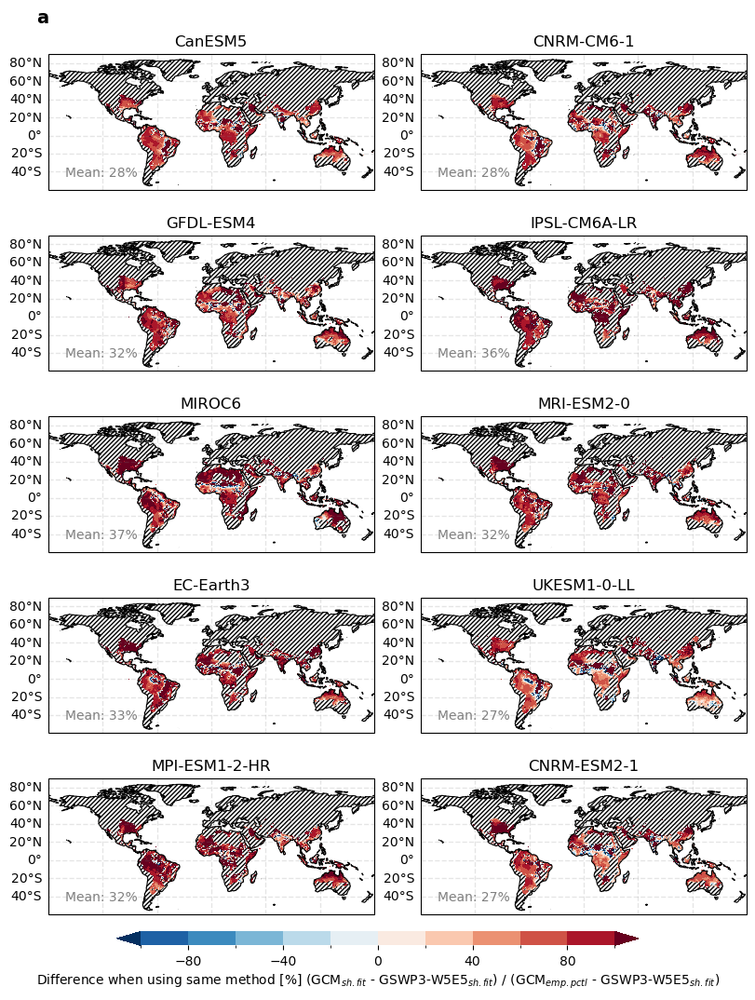

In [130]:

#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_diff_total.isel(model=i)
    data2=da_diff_notmethod.isel(model=i)
    data_plot = data2 * landmask * 100

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, extend='both'
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data1) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

    # calc statistics 
    # area weighted mean of explained difference
    bias= bias_weighted(data2, 0, cellarea=cellarea, mask=True) * 100

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"Mean: {int(bias.round(0))}%" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('Difference when using same method [%] (GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$) / (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

More than 100% means the difference is actually higher when using SF than when using EP - understand better... 

Neg means the differences have different signs : generally same sign of difference 

### decompose 1. difference in p0, p1, trend, per month and total 

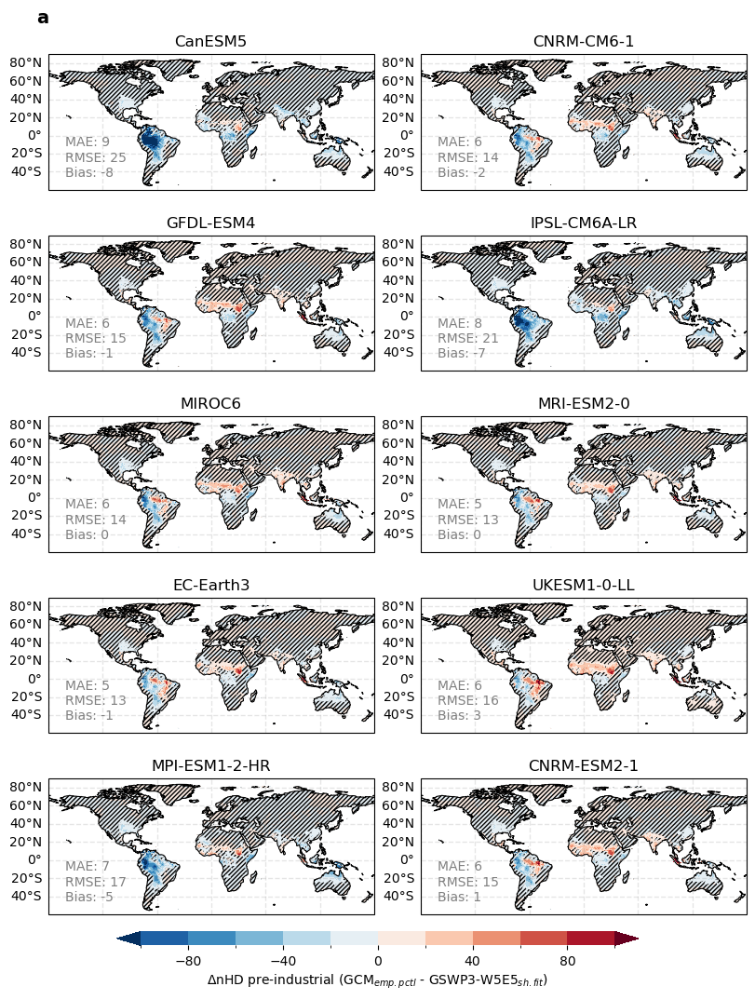

In [131]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_p0_mod_sf_year.isel(model=i) 
    data2=da_p0_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nHD pre-industrial (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

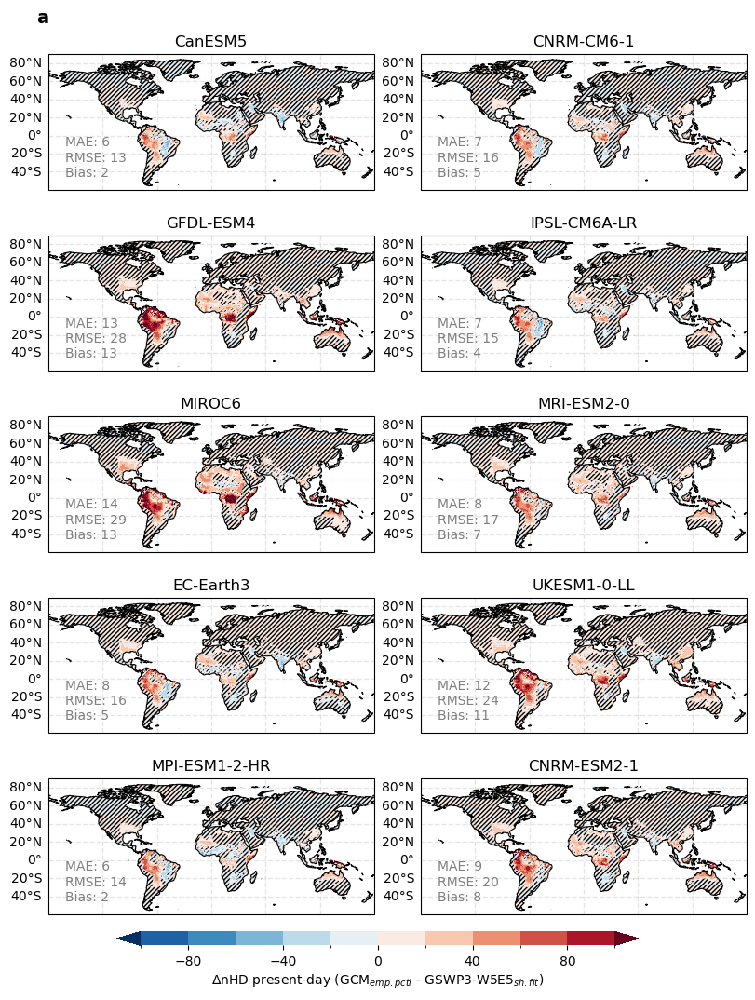

In [132]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=100
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break

    data1=da_p1_mod_sf_year.isel(model=i) 
    data2=da_p1_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nHD present-day (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

### Difference per month

In [133]:
da_nAHD_mo_mod_sf.mean(dim='dataset')
da_nAHD_mo.isel(dataset=0)

<xarray.DataArray (month: 12, lat: 360, lon: 720)>
array([[[ 1.98831737e-14,  1.98022934e-14,  1.97316108e-14, ...,
          7.91299797e-15,  7.87404089e-15,  1.19484375e-14],
        [ 1.04235651e-14,  1.02809837e-14,  1.01299765e-14, ...,
          4.75392691e-15,  4.71141689e-15,  7.30946065e-15],
        [ 7.02705226e-15,  6.87343561e-15,  6.72784622e-15, ...,
          7.58802396e-15,  7.42962795e-15,  7.28517112e-15],
        ...,
        [-3.20351773e-53, -3.20173193e-53, -3.45447161e-53, ...,
         -6.76874604e-54, -6.98679051e-54, -1.11990116e-53],
        [-1.16671875e-52, -1.16636408e-52, -1.23464926e-52, ...,
         -4.54417429e-53, -4.40243393e-53, -5.37469155e-53],
        [-1.62301520e-51, -1.59033432e-51, -1.63904043e-51, ...,
         -9.49983887e-52, -9.45288454e-52, -1.22194350e-51]],

       [[ 2.36436352e-17,  2.35243960e-17,  2.34071499e-17, ...,
          1.77725736e-17,  1.76739783e-17,  2.16276913e-17],
        [ 7.37078774e-18,  7.23171110e-18,  7.09911418e-18, ...,
          5.85060143e-18,  5.76534989e-18,  6.93057843e-18],
        [ 3.47465721e-18,  3.34808380e-18,  3.23204525e-18, ...,
          4.59253255e-18,  4.41340274e-18,  3.65324419e-18],
...
        [-5.16322167e-37, -5.33712383e-37, -5.73401262e-37, ...,
         -7.01484531e-37, -7.28515007e-37, -6.06356571e-37],
        [-9.34429865e-37, -9.42693581e-37, -9.77872134e-37, ...,
         -1.31550728e-36, -1.30859062e-36, -1.13557596e-36],
        [-1.17515203e-36, -1.17592280e-36, -1.21476049e-36, ...,
         -1.30162739e-36, -1.32492723e-36, -1.32015882e-36]],

       [[ 1.08055684e-15,  1.07281640e-15,  1.06599368e-15, ...,
          3.59306722e-16,  3.56429218e-16,  6.26602352e-16],
        [ 7.13030746e-16,  6.99550847e-16,  6.87578037e-16, ...,
          3.36854570e-16,  3.33086578e-16,  4.68392483e-16],
        [ 3.66287905e-16,  3.60017883e-16,  3.54465714e-16, ...,
          3.60526937e-16,  3.53312643e-16,  3.56221764e-16],
        ...,
        [ 4.29084012e-58,  4.33874874e-58,  4.66266267e-58, ...,
          2.83150116e-58,  2.91623657e-58,  3.29689380e-58],
        [ 1.63396005e-56,  1.63991646e-56,  1.74924764e-56, ...,
          1.07378391e-56,  1.07746158e-56,  1.13177077e-56],
        [ 1.11581474e-55,  1.10572108e-55,  1.16098673e-55, ...,
          1.19110321e-55,  1.21987725e-55,  1.24574663e-55]]])
Coordinates:
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float32 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
    dataset  <U11 'GSWP3-W5E5'

In [134]:
da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1)

<xarray.DataArray (lat: 360, lon: 720)>
array([[3.69354433e-15, 3.71039685e-15, 3.71932197e-15, ...,
        3.67449133e-15, 3.68334221e-15, 3.68201320e-15],
       [2.52120156e-13, 2.42980848e-13, 2.59970591e-13, ...,
        2.45870505e-13, 2.45099136e-13, 2.38006638e-13],
       [2.38987220e-15, 2.38865965e-15, 2.37495528e-15, ...,
        2.41917726e-15, 2.39652706e-15, 2.36736119e-15],
       ...,
       [5.03351259e-34, 6.44842235e-34, 5.63869024e-34, ...,
        6.12847998e-34, 5.29499817e-34, 5.77484943e-34],
       [7.73562429e-32, 7.27686462e-32, 7.29447288e-32, ...,
        7.10435525e-32, 7.38827806e-32, 6.65841373e-32],
       [4.13525624e-36, 4.47901985e-36, 5.76400316e-36, ...,
        3.04731952e-36, 4.01457911e-36, 3.89297120e-36]])
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
    month    int64 10

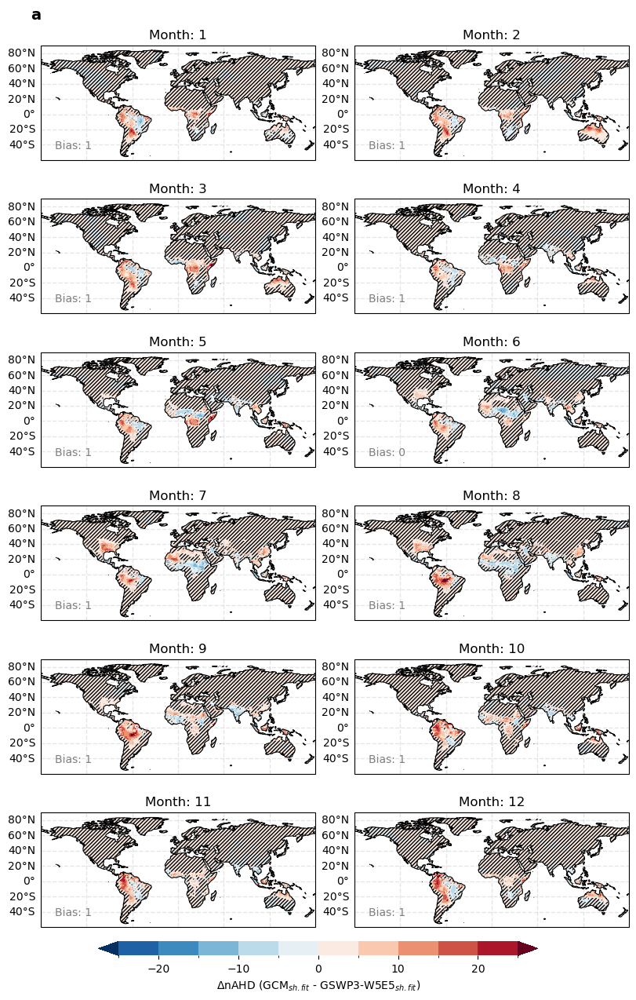

In [135]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=25
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1)
    data2=da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

In [136]:
# % of total difference each month?? 





#### difference in parameters

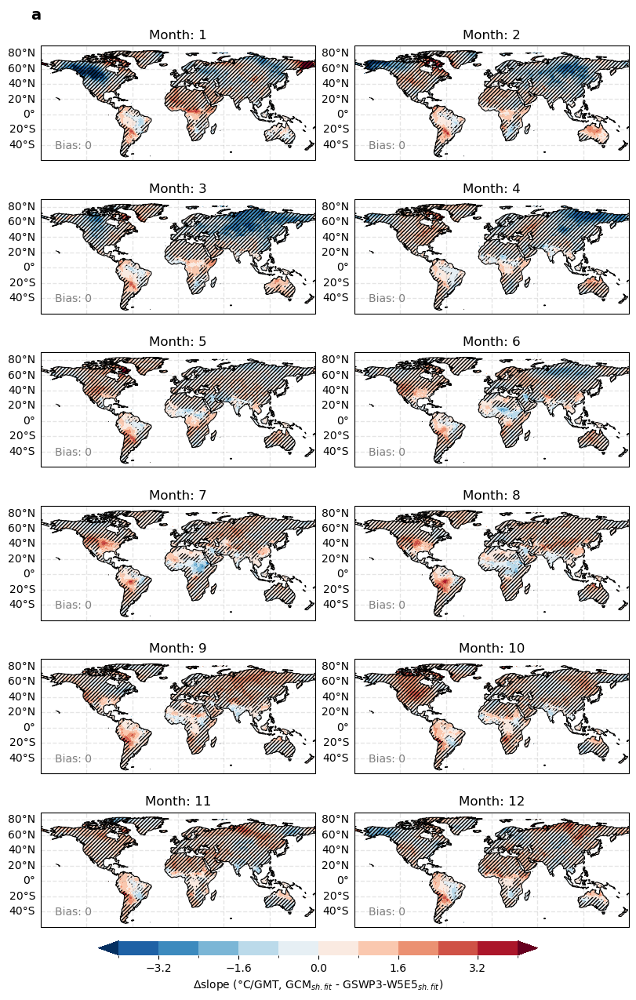

In [137]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=4
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params_mod.mean(dim='dataset').sel(params='b1').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=0).sel(params='b1').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    sig = np.abs(diff) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$slope ($\degree$C/GMT, GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

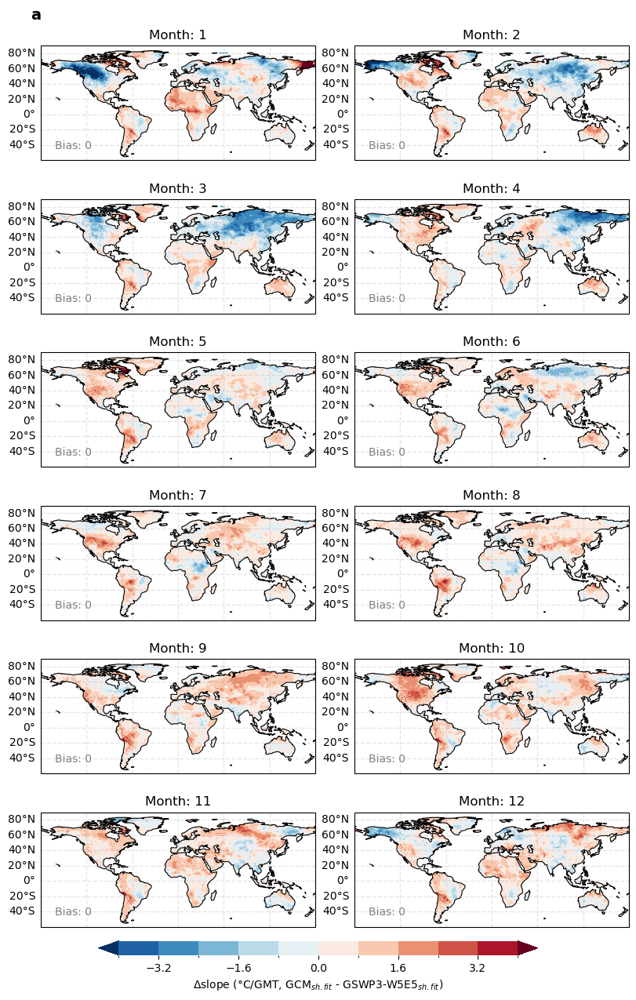

In [138]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=4
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params_mod.mean(dim='dataset').sel(params='b1').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=0).sel(params='b1').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # # stippling - delete this to have without significance assessment
    # diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    # sig = np.abs(diff) > 1
    # # hatch = n.s.
    # sig_inv = ~sig
    # cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$slope ($\degree$C/GMT, GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

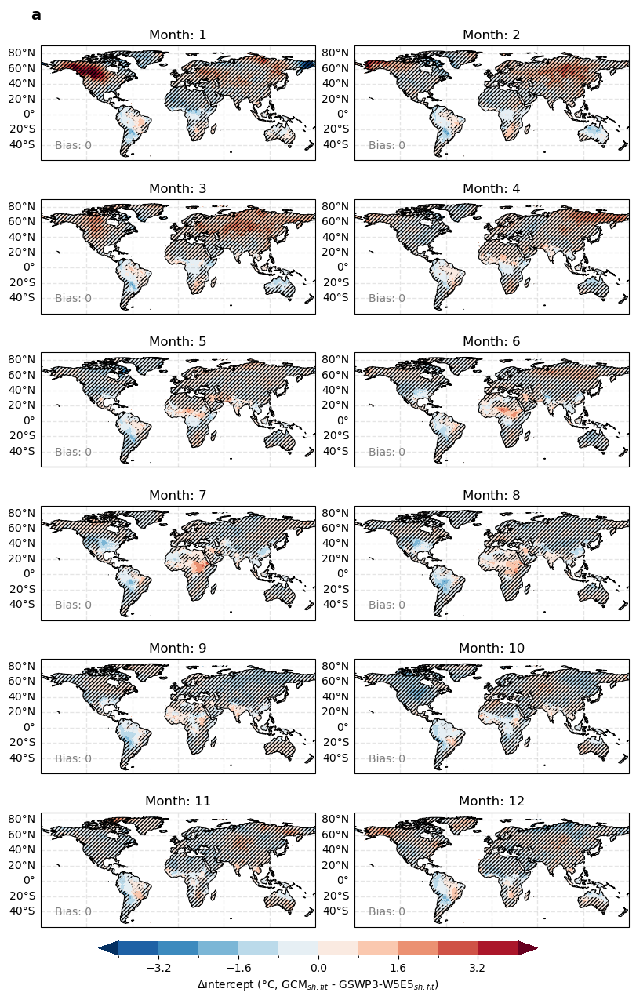

In [139]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=4
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params_mod.mean(dim='dataset').sel(params='b0').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=0).sel(params='b0').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    sig = np.abs(diff) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$intercept ($\degree$C, GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

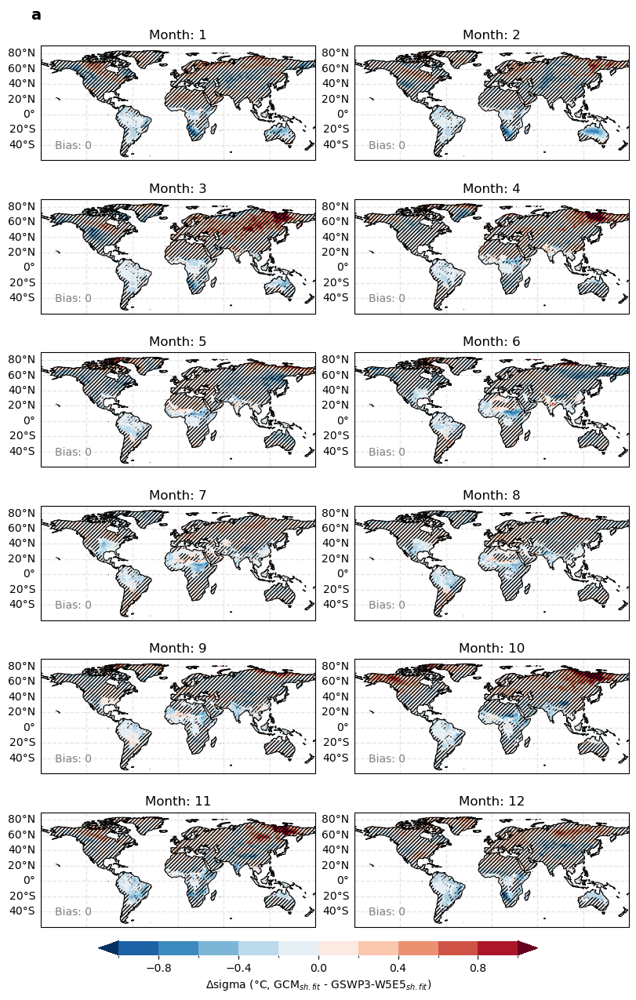

In [140]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=1
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params_mod.mean(dim='dataset').sel(params='sigma').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=0).sel(params='sigma').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    sig = np.abs(diff) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$sigma ($\degree$C, GCM$_{sh. fit}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

### decompose difference from slope vs. sigma

#### 1) fix sigma from reanalysis and use slope and intercept from models to calc nAHD per month and total

In [141]:
da_params.isel(dataset=0).sel(params='sigma')

<xarray.DataArray 'fit_params' (month: 12, lat: 360, lon: 720)>
array([[[5.95694662, 5.95677351, 5.95665209, ..., 5.87874504,
         5.87852483, 5.9138269 ],
        [5.89030695, 5.8897826 , 5.88917318, ..., 5.8255887 ,
         5.82508382, 5.86066964],
        [5.83893617, 5.83767954, 5.83643713, ..., 5.84133269,
         5.8400686 , 5.8404703 ],
        ...,
        [3.60865374, 3.60856361, 3.60876024, ..., 3.58626362,
         3.58612449, 3.59361667],
        [3.66038699, 3.66047742, 3.66055351, ..., 3.64886873,
         3.64773876, 3.64848573],
        [3.73622475, 3.73614565, 3.73601524, ..., 3.73197152,
         3.73182629, 3.73343894]],

       [[5.46987409, 5.46973352, 5.46959983, ..., 5.45465055,
         5.45449984, 5.46643888],
        [5.38561015, 5.38503498, 5.38450209, ..., 5.37635226,
         5.37574801, 5.38475132],
        [5.33309894, 5.33129766, 5.32959684, ..., 5.35112683,
         5.34903926, 5.33735029],
...
        [4.84826455, 4.84911199, 4.85003213, ..., 4.85909093,
         4.85938341, 4.85312617],
        [4.91473101, 4.9149763 , 4.91504504, ..., 4.92628337,
         4.92516092, 4.92055022],
        [4.95360338, 4.95356056, 4.95344341, ..., 4.95857255,
         4.95842624, 4.95721638]],

       [[5.50894083, 5.50840555, 5.50791713, ..., 5.42963348,
         5.42907163, 5.46982178],
        [5.48341159, 5.48222877, 5.48124249, ..., 5.43185448,
         5.43087811, 5.45410417],
        [5.43955805, 5.43827499, 5.43709406, ..., 5.43849249,
         5.43691491, 5.43774591],
        ...,
        [3.43769401, 3.43768674, 3.43764788, ..., 3.43397645,
         3.43368349, 3.43510844],
        [3.48581012, 3.48577638, 3.48574414, ..., 3.48147269,
         3.48077232, 3.4816178 ],
        [3.50663664, 3.50648668, 3.50631735, ..., 3.50916133,
         3.50897902, 3.50940685]]])
Coordinates:
  * lat      (lat) float32 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
    params   <U5 'sigma'
    dataset  <U11 'GSWP3-W5E5'

In [142]:
da_params_mod

<xarray.DataArray 'fit_params' (dataset: 10, month: 12, lat: 360, lon: 720,
                                params: 3)>
array([[[[[-2.49495439e+01, -1.48788528e-01,  5.50431205e+00],
          [-2.49464177e+01, -1.62544655e-01,  5.51231098e+00],
          [-2.49111824e+01, -2.54900166e-01,  5.51338040e+00],
          ...,
          [-2.49424435e+01, -1.61727472e-01,  5.51187089e+00],
          [-2.48951176e+01, -2.71800819e-01,  5.51553799e+00],
          [-2.49002269e+01, -2.76439931e-01,  5.52299847e+00]],

         [[-2.62064202e+01,  1.59506695e+00,  5.59353930e+00],
          [-2.62116750e+01,  1.58327947e+00,  5.59022359e+00],
          [-2.61947629e+01,  1.53320707e+00,  5.59509524e+00],
          ...,
          [-2.61960200e+01,  1.57601237e+00,  5.60484772e+00],
          [-2.61606000e+01,  1.51249646e+00,  5.59961934e+00],
          [-2.61682188e+01,  1.52201227e+00,  5.61156215e+00]],

         [[-2.80240138e+01,  4.24847041e+00,  5.82878187e+00],
          [-2.80336099e+01,  4.25774125e+00,  5.82894115e+00],
          [-2.80249053e+01,  4.24946995e+00,  5.84480631e+00],
          ...,
...
          ...,
          [-2.90897799e+01,  1.25391182e+00,  2.96778916e+00],
          [-2.90810408e+01,  1.25123265e+00,  2.96541372e+00],
          [-2.90760265e+01,  1.25393690e+00,  2.97193890e+00]],

         [[-2.98247780e+01,  2.01730641e+00,  3.03147379e+00],
          [-2.98234018e+01,  2.02029360e+00,  3.02571728e+00],
          [-2.98099813e+01,  2.01662382e+00,  3.03117110e+00],
          ...,
          [-2.98486018e+01,  2.02079339e+00,  3.02911596e+00],
          [-2.98345994e+01,  2.01607679e+00,  3.03425128e+00],
          [-2.98308584e+01,  2.01777341e+00,  3.02648146e+00]],

         [[-2.91713019e+01,  6.33416266e-01,  3.06128507e+00],
          [-2.91699130e+01,  6.27534401e-01,  3.06300241e+00],
          [-2.91613319e+01,  6.36188337e-01,  3.06140488e+00],
          ...,
          [-2.91869426e+01,  6.26858758e-01,  3.06510796e+00],
          [-2.91768676e+01,  6.29320512e-01,  3.06381035e+00],
          [-2.91784647e+01,  6.27432459e-01,  3.06456049e+00]]]]])
Coordinates:
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * params   (params) object 'b0' 'b1' 'sigma'
  * dataset  (dataset) <U13 'CanESM5' 'CNRM-CM6-1' ... 'CNRM-ESM2-1'

In [143]:
da_params_slope_effect = da_params_mod.copy()

da_params_slope_effect.loc[dict(params='sigma')] = (
    da_params.isel(dataset=0).sel(params='sigma')
)

In [144]:
da_nAHD_mod_slope_effect, da_nAHD_mo_mod_slope_effect, da_p0_mod_slope_effect, da_p1_mod_slope_effect = calc_nAHD_shift_fit(da_params_slope_effect, threshold=28, gmst_smo=da_gmst_mod_smo,year_pres=da_years,GWI=1.3)

da_nAHD_mod_slope_effect = da_nAHD_mod_slope_effect.rename({'dataset':'model'})

In [145]:
da_params_sigma_effect = da_params_mod.copy()

da_params_sigma_effect.loc[dict(params=['b0', 'b1'])] = (
    da_params.isel(dataset=0).sel(params=['b0', 'b1'])
)

In [146]:
da_nAHD_mod_sigma_effect, da_nAHD_mo_mod_sigma_effect, da_p0_mod_sigma_effect, da_p1_mod_sigma_effect = calc_nAHD_shift_fit(da_params_sigma_effect, threshold=28, gmst_smo=da_gmst_mod_smo,year_pres=da_years,GWI=1.3)

da_nAHD_mod_sigma_effect = da_nAHD_mod_sigma_effect.rename({'dataset':'model'})

In [147]:
gmst_smo = get_gmst_smo(ntime=4, observed_warming_path=observed_warming_path_annual)


da_nAHD_mod_sigma_effect_obsgmt, da_nAHD_mo_mod_sigma_effect_obsgmt, da_p0_mod_sigma_effect_obsgmt, da_p1_mod_sigma_effect_obsgmt = calc_nAHD_shift_fit(da_params_sigma_effect, threshold=28, gmst_smo=gmst_smo,year_pres=2023,GWI=1.3)

da_nAHD_mod_sigma_effect_obsgmt = da_nAHD_mod_sigma_effect_obsgmt.rename({'dataset':'model'})

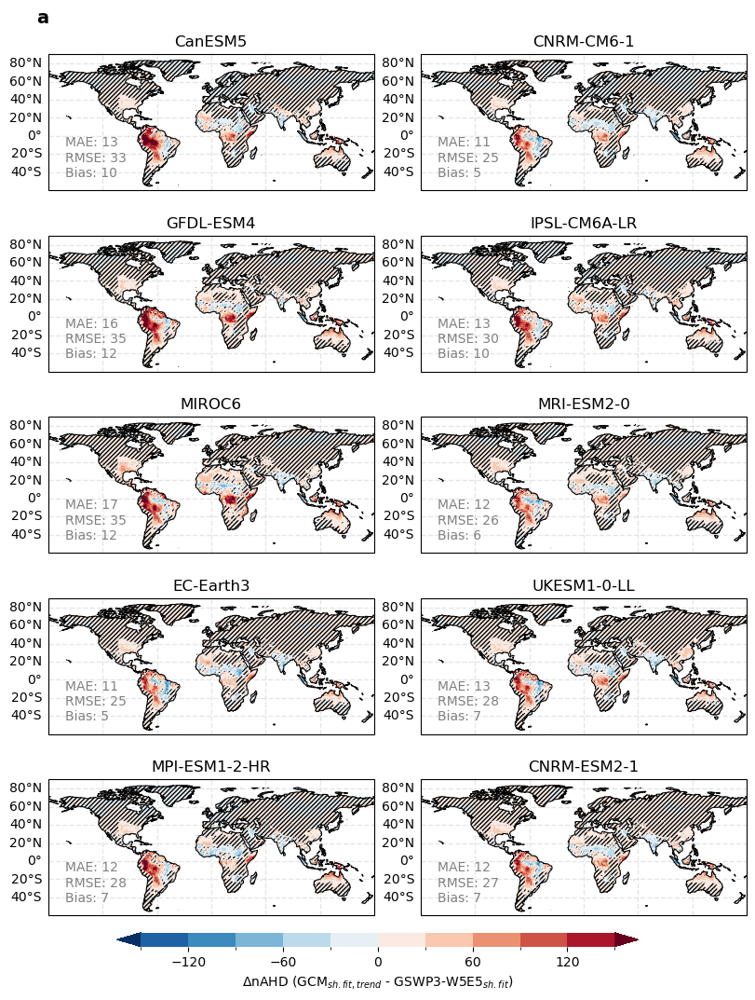

In [148]:

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=150
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break
    
    data1=da_nAHD_mod_slope_effect.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit, trend}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_emp_vs_shf_long.png'),dpi=300)

In [149]:
data1=da_nAHD_mod_slope_effect.mean(dim='model')
data1

<xarray.DataArray (lat: 360, lon: 720)>
array([[5.66706706e-14, 5.70013328e-14, 5.67776950e-14, ...,
        5.19670917e-14, 5.18931898e-14, 5.37574778e-14],
       [1.08698837e-12, 1.08598335e-12, 1.08245990e-12, ...,
        9.76423837e-13, 9.71508798e-13, 1.02305544e-12],
       [2.85974821e-13, 2.86068793e-13, 2.81526147e-13, ...,
        2.78012624e-13, 2.75714235e-13, 2.71188148e-13],
       ...,
       [1.03917794e-31, 1.06350810e-31, 1.11254732e-31, ...,
        8.04194817e-32, 8.25528325e-32, 9.32298189e-32],
       [6.12071953e-33, 6.37531006e-33, 6.37060330e-33, ...,
        7.96514980e-33, 7.64527429e-33, 7.63272119e-33],
       [2.65655713e-35, 2.69362951e-35, 2.72895586e-35, ...,
        3.06918817e-35, 3.04161985e-35, 2.88132417e-35]])
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75

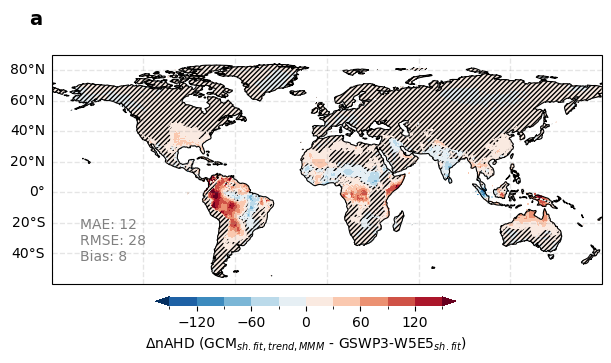

In [150]:
# plot MMM 

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=150
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, ax = plt.subplots(figsize=(6,3),layout='constrained',subplot_kw={'projection': crs})

dataset=0

data1=da_nAHD_mod_slope_effect.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )

# stippling - delete this to have without significance assessment
sig = np.abs(data_plot) > 5
# hatch = n.s.
sig_inv = ~sig
cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                

# calc statistics 
rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

ax.text(.05,.1, 
    f"MAE: {int(mae.values.round(0))}\n"
    f"RMSE: {int(rmse.values.round(0))}\n"
    f"Bias: {int(bias.values.round(0))}" ,
    transform=ax.transAxes,
    c='gray')

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=1, color='gray', alpha=0.2, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.25, 0, 0.5, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit, trend, MMM}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);

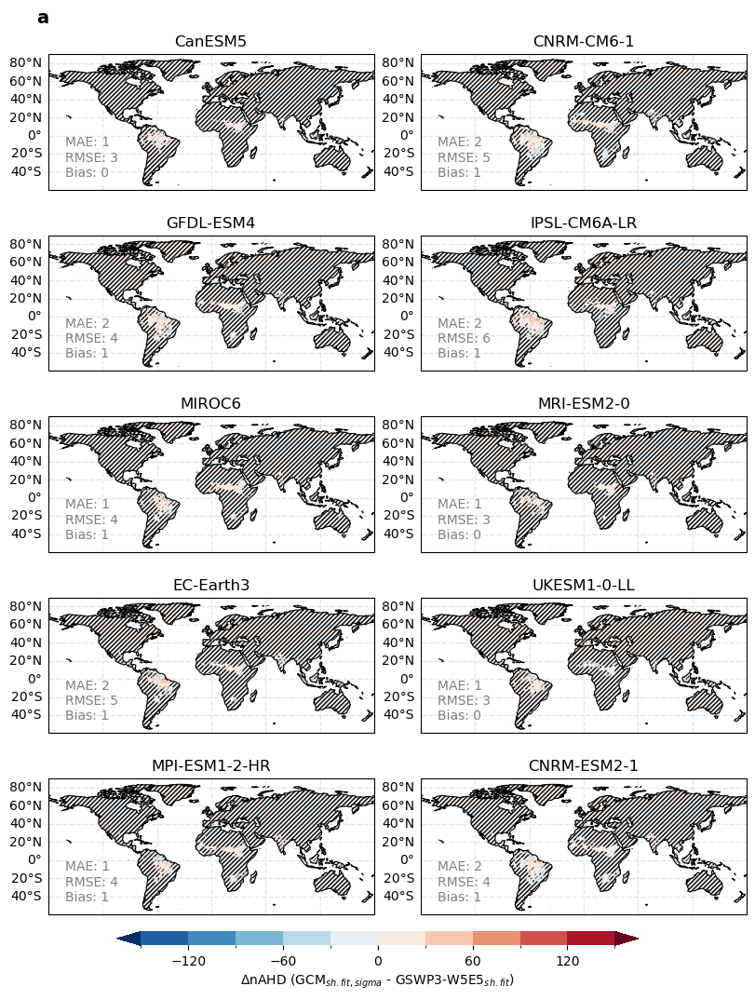

In [151]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=150
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(5,2, figsize=(8,10),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 10:
        break
    
    data1=da_nAHD_mod_sigma_effect_obsgmt.isel(model=i)
    data2=da_nAHD_obs.isel(dataset=dataset)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, vmin=vmin, vmax=vmax, levels=levels, skew=False
                    )
    
    # stippling - delete this to have without significance assessment
    sig = np.abs(data_plot) > 5
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'{data1.model.values.item()}')
    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit, sigma}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_emp_vs_shf_long.png'),dpi=300)

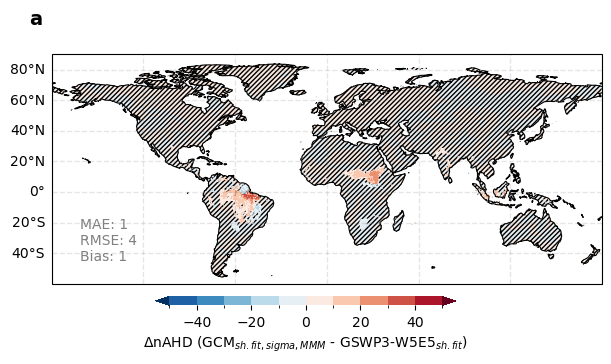

In [152]:
# plot MMM 

landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=50
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, ax = plt.subplots(figsize=(6,3),layout='constrained',subplot_kw={'projection': crs})

dataset=0

data1=da_nAHD_mod_sigma_effect_obsgmt.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )

# stippling - delete this to have without significance assessment
sig = np.abs(data_plot) > 5
# hatch = n.s.
sig_inv = ~sig
cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                

# calc statistics 
rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

ax.text(.05,.1, 
    f"MAE: {int(mae.values.round(0))}\n"
    f"RMSE: {int(rmse.values.round(0))}\n"
    f"Bias: {int(bias.values.round(0))}" ,
    transform=ax.transAxes,
    c='gray')

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=1, color='gray', alpha=0.2, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.25, 0, 0.5, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$nAHD (GCM$_{sh. fit, sigma, MMM}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);

In [153]:
da_diff_slope_effect = ( da_nAHD_mod_slope_effect - da_nAHD_obs.isel(dataset=dataset) ) * landmask

df_zonal_slope_effect = da_diff_slope_effect.mean(dim='lon').to_pandas().T  # rows = models, columns = lat

<Axes: xlabel='lat'>

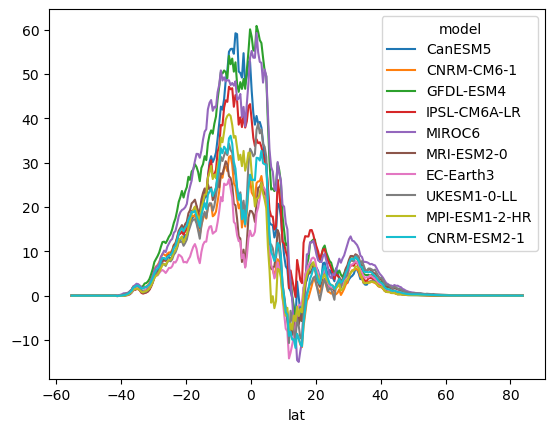

In [154]:
df_zonal_slope_effect.plot()

<Axes: xlabel='lat'>

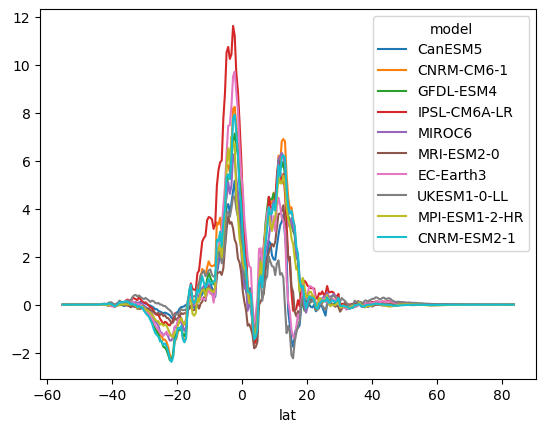

In [155]:
da_diff_sigma_effect = ( da_nAHD_mod_sigma_effect_obsgmt - da_nAHD_obs.isel(dataset=dataset) ) * landmask

df_zonal_sigma_effect = da_diff_sigma_effect.mean(dim='lon').to_pandas().T  # rows = models, columns = lat

df_zonal_sigma_effect.plot()


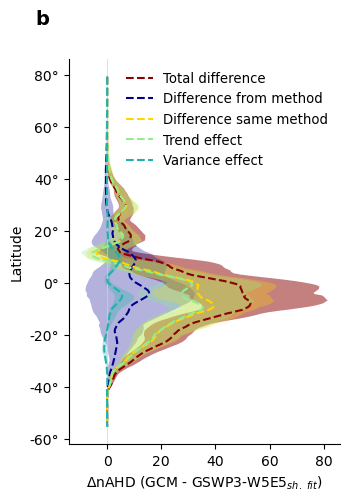

In [156]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(3.5, 5))

ax.axvline(0, lw=.5, c='lightgray')



# total difference
df = df_zonal 
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Total difference', 
        c='darkred', ls='--')

ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color='darkred',
                alpha=.5,
                edgecolor=None,
                )

# due to method
df = df_method
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Difference from method', 
        c='darkblue', ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='darkblue',
        alpha=.3,
        edgecolor=None,
        )

# remaining in sf - to decompose further! 
df = df_zonal_sf
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Difference same method', 
        c='gold', 
        ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='gold',
        alpha=.3,
        edgecolor=None,
        )

# slope effect
df = df_zonal_slope_effect
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Trend effect', 
        c='lightgreen', 
        ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='lightgreen',
        alpha=.3,
        edgecolor=None,
        )

# sigma effect
df = df_zonal_sigma_effect
ax.plot(df.median(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Variance effect', 
        c='lightseagreen', 
        ls='--')

ax.fill_betweenx(df.index.values, 
        df.rolling(10).mean().values.min(axis=1),
        df.rolling(10).mean().values.max(axis=1),
        color='lightseagreen',
        alpha=.3,
        edgecolor=None,
        )


ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False,fontsize=9.5)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.suptitle('b', fontweight='bold',x=0.05, fontsize=14);
#plt.grid()


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_zonalavg.png'),dpi=300)


# I could do this as barplots! like IPCC contribution to warming 


In [157]:
# do % explained plot for each! 

# Plot with full decomposition

In [215]:
def hatch_and_annotate(
    ax,
    plot,
    data1,
    data2,
    data_plot,
    sig=1,
    mae=True,
    rmse=True,
    bias=True,
    cbar_label=None,
):

    # hatch = n.s.
    sig_inv = ~(np.abs(data_plot) > sig)
    cont = ax.contourf(sig_inv.lon, sig_inv.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

    # calc statistics 
    rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.text(.05,.1, 
        f"MAE: {int(mae.values.round(0))}\n"
        f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(0))}" ,
        transform=ax.transAxes,
        c='gray')

    # plot gridlines
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False

    # Colorbar
    cbar = fig.colorbar(plot, ax=ax, location='bottom', shrink=1, fraction=0.05,pad=.04)
    cbar.set_label(cbar_label )
    cbar.outline.set_edgecolor('none')



/user/brussel/104/vsc10419/.local/lib/python3.11/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/user/brussel/104/vsc10419/.local/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


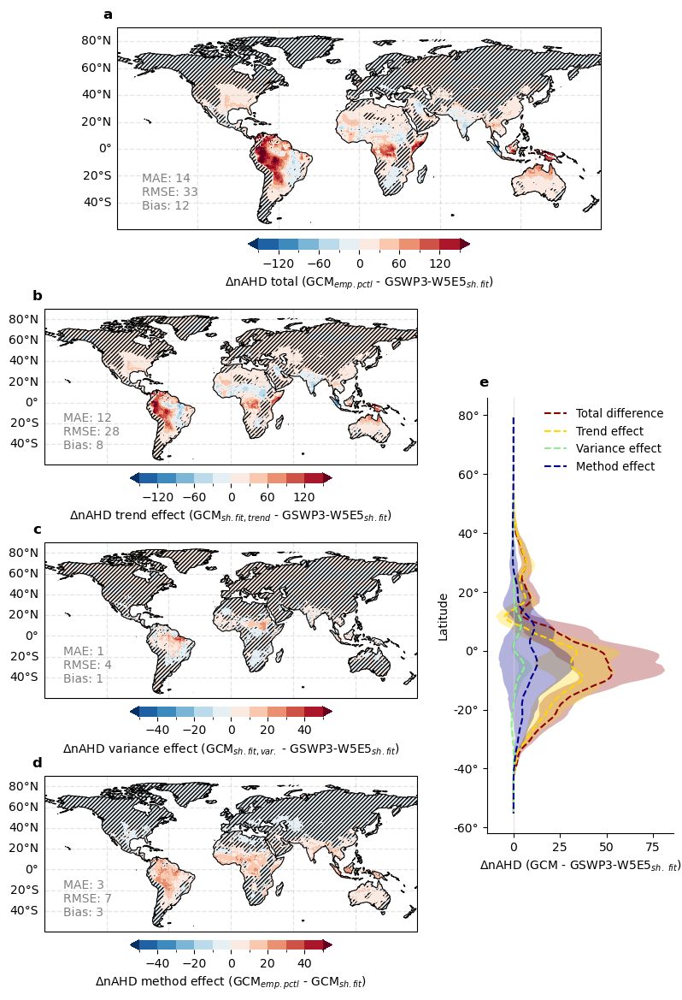

In [350]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec


landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
dataset=0
levels=11
sig = 1 # decide sig 1 or 5 !! 

# Figure 
fig = plt.figure(figsize=(9.5, 14), layout='tight')

gs = GridSpec(
    nrows=7,
    ncols=2,
    figure=fig,
    width_ratios=[2,1],
    height_ratios=[1.3, .5, .5, .5, .5, .5, .5],
    hspace=0.3,
    wspace=0.25,
)

# Top centered map (spans both columns)
ax_top = fig.add_subplot(gs[0, :], projection=crs)


# Left column maps
ax_map1 = fig.add_subplot(gs[1:3, 0], projection=crs)
ax_map2 = fig.add_subplot(gs[3:5, 0], projection=crs)
ax_map3 = fig.add_subplot(gs[5:7, 0], projection=crs)

# Right column latitude profile (spans rows)
ax_profile = fig.add_subplot(gs[2:6, 1])

axes = [ax_top,ax_map1,ax_map2,ax_map3,ax_profile ]

# Plot 

# a total difference
vmax=150
vmin=-vmax
ax=axes[0]

data1=da_nAHD_mod_emp.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )
hatch_and_annotate(
    ax,
    plot,
    data1,
    data2,
    data_plot,
    sig=sig,
    cbar_label='$\Delta$nAHD total (GCM$_{emp. pctl}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)',
)


# b trend effect 
ax=axes[1]
data1=da_nAHD_mod_slope_effect.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )
hatch_and_annotate(
    ax,
    plot,
    data1,
    data2,
    data_plot,
    sig=sig,
    cbar_label='$\Delta$nAHD trend effect (GCM$_{sh. fit, trend}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' ,
)

# c variance effect
vmax=50
vmin=-vmax
ax=axes[2]

data1=da_nAHD_mod_sigma_effect_obsgmt.mean(dim='model')
data2=da_nAHD_obs.isel(dataset=dataset)
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )
hatch_and_annotate(
    ax,
    plot,
    data1,
    data2,
    data_plot,
    sig=sig,
    cbar_label='$\Delta$nAHD variance effect (GCM$_{sh. fit, var.}$ - '+f'{datasets[dataset]}'+'$_{sh. fit}$)' ,
)

# d method effect
ax=axes[3]

data1=da_nAHD_mod_emp.mean(dim='model')
data2=da_nAHD_mod_sf.mean(dim='model')
data_plot = ( data1 - data2 ) * landmask

plot = plot_map_nAHD(data_plot,
            ax, vmin=vmin, vmax=vmax, levels=levels, skew=False, title=False
                )

hatch_and_annotate(
    ax,
    plot,
    data1,
    data2,
    data_plot,
    sig=1,
    cbar_label='$\Delta$nAHD method effect (GCM$_{emp. pctl}$ - '+'GCM$_{sh. fit}$)',
)


# e zonal average > give multi model mean or median?  
ax=axes[4]
ax.axvline(0, lw=.5, c='lightgray')

dfs = [df_zonal,df_zonal_slope_effect,df_zonal_sigma_effect, df_method]
colors = ['darkred','gold','lightgreen','darkblue'  ] # 'lightseagreen',
labels = ['Total difference', 'Trend effect', 'Variance effect', 'Method effect']

for df,col,lab in zip(dfs,colors,labels):
    ax.plot(df.mean(axis=1).rolling(10).mean().values, 
        df.index.values,
        label=lab, 
        c=col, ls='--')

    ax.fill_betweenx(df.index.values, 
                df.rolling(10).mean().values.min(axis=1),
                df.rolling(10).mean().values.max(axis=1),
                color=col,
                alpha=.3,
                edgecolor=None,
                )

ax.set_ylabel(r'Latitude')
ax.set_xlabel(r'$\Delta$nAHD (GCM - ' + f'{datasets[dataset]}' + r'$_{sh.\ fit}$)')

ax.legend(frameon=False,fontsize=9.5)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

titles = ['a','b','c','d','e']

for tit,ax in zip(titles,axes):
    ax.set_title(tit, fontweight='bold',x=-.02,y=1.01)

# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_decompose_difference.png'),dpi=300)



## % difference decomposition

In [341]:
da_diff_total = ( da_nAHD_mod_emp - da_nAHD_obs.isel(dataset=dataset) ) * landmask
da_diff_to_explain = da_diff_total.where(np.abs(da_diff_total)>5)

da_diff_method = ( da_nAHD_mod_emp - da_nAHD_mod_sf ) * landmask
da_diff_explained_method = da_diff_method / da_diff_to_explain 
df_diff_explained_method = da_diff_explained_method.mean(dim='lon').to_pandas().T * 100

da_diff_trend = ( da_nAHD_mod_slope_effect - da_nAHD_obs.isel(dataset=dataset) ) * landmask
da_diff_explained_trend = da_diff_trend / da_diff_to_explain 
df_diff_explained_trend = da_diff_explained_trend.mean(dim='lon').to_pandas().T * 100

da_diff_variance = ( da_nAHD_mod_sigma_effect_obsgmt - da_nAHD_obs.isel(dataset=dataset) ) * landmask
da_diff_explained_variance = da_diff_variance / da_diff_to_explain 
df_diff_explained_variance = da_diff_explained_variance.mean(dim='lon').to_pandas().T * 100



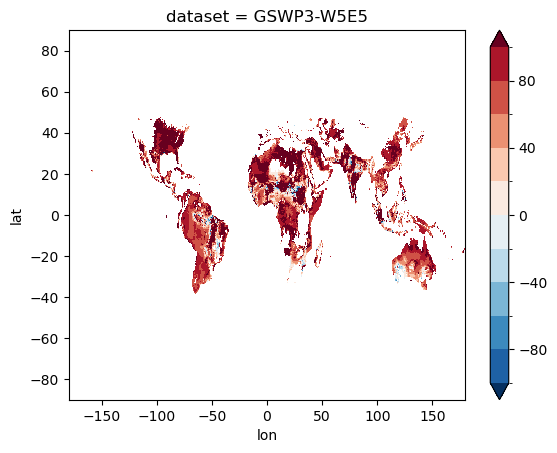

In [342]:
(da_diff_explained_trend.mean(dim='model') * 100).plot(levels=11,vmin=-100,vmax=100,cmap='RdBu_r')

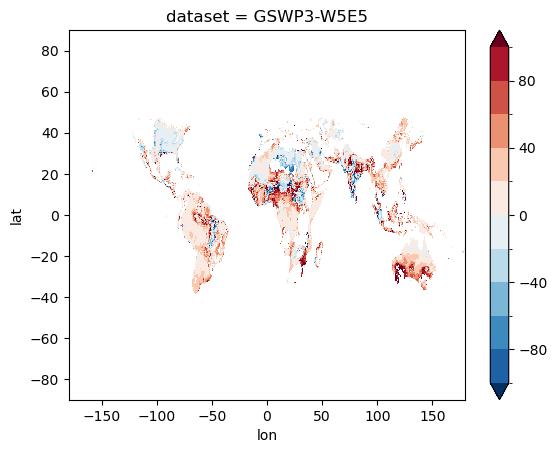

In [343]:
(da_diff_explained_method.mean(dim='model') * 100).plot(levels=11,vmin=-100,vmax=100,cmap='RdBu_r')

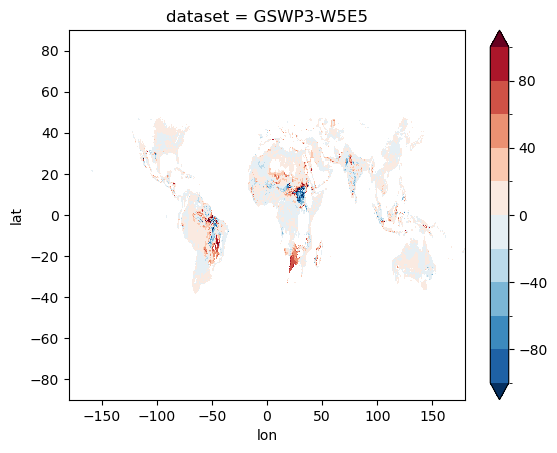

In [344]:
(da_diff_explained_variance.mean(dim='model') * 100).plot(levels=11,vmin=-100,vmax=100,cmap='RdBu_r')

(-40.0, 45.0)

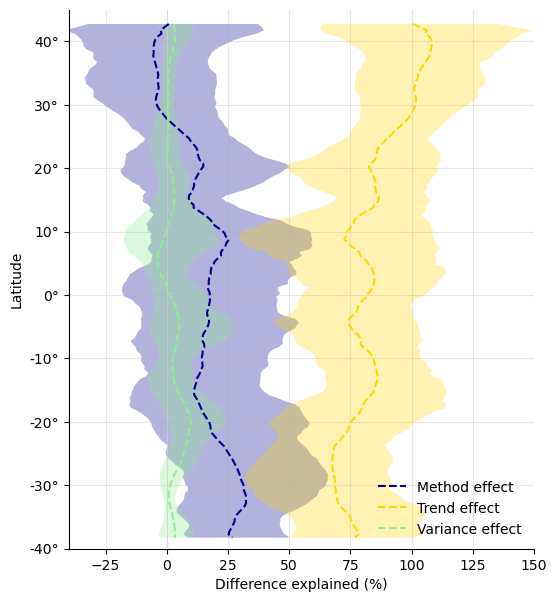

In [345]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(6, 7))

ax.axvline(0, lw=.5, c='lightgray')

# a
df = df_diff_explained_method
ax.plot(df.mean(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Method effect', 
        c='darkblue', ls='--')

ax.fill_betweenx(df.index.values, 
                df.min(axis=1).rolling(10).mean().values,
                df.max(axis=1).rolling(10).mean().values,
                color='darkblue',
                alpha=.3,
                edgecolor=None,
                label=None
                )

# b
df = df_diff_explained_trend
ax.plot(df.mean(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Trend effect', 
        c='gold', ls='--')

ax.fill_betweenx(df.index.values, 
                df.min(axis=1).rolling(10).mean().values,
                df.max(axis=1).rolling(10).mean().values,
                color='gold',
                alpha=.3,
                edgecolor=None,
                label=None
                )

# c
df = df_diff_explained_variance
ax.plot(df.mean(axis=1).rolling(10).mean().values, 
        df.index.values,
        label='Variance effect', 
        c='lightgreen', ls='--')

ax.fill_betweenx(df.index.values, 
                df.min(axis=1).rolling(10).mean().values,
                df.max(axis=1).rolling(10).mean().values,
                color='lightgreen',
                alpha=.3,
                edgecolor=None,
                label=None
                )



ax.set_ylabel(r'Latitude')
ax.set_xlabel('Difference explained (%)')

ax.legend(frameon=False,)
ax.yaxis.set_major_formatter(
    FuncFormatter(lambda y, _: f"{y:.0f}°")
)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.grid(alpha=.3)
plt.xlim(-40,150)
plt.ylim(-40,45)

# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_decompose_difference_percent_zonal.png'),dpi=300)


In [ ]:

rnd = 0 

# but have to area weigh! 

print(f'percent difference explained where nAHD diff abs > 5 days \n \
    trend: {df_diff_explained_trend.mean(axis=0).mean().round(rnd)} ({round(df_diff_explained_trend.mean(axis=0).min(),rnd)} - {round(df_diff_explained_trend.mean(axis=0).max(),rnd)}) \n \
    method: {df_diff_explained_method.mean(axis=0).mean().round(rnd)} ({round(df_diff_explained_method.mean(axis=0).min(),rnd)} - {round(df_diff_explained_method.mean(axis=0).max(),rnd)})  \n \
    variance: {df_diff_explained_variance.mean(axis=0).mean().round(rnd)} ({round(df_diff_explained_variance.mean(axis=0).min(),rnd)} - {round(df_diff_explained_variance.mean(axis=0).max(),rnd)})  \n'
    )

percent difference explained where nAHD diff abs > 5 days 
     trend: 84.0 (65.0 - 95.0) 
     method: 14.0 (-1.0 - 34.0)  
     variance: 2.0 (0.0 - 6.0)  



In [352]:

rnd = 0 

print(f'percent difference explained where nAHD diff abs > 5 days \n \
    trend: {round(df_diff_explained_trend.mean(axis=0).median(),rnd)} ({round(df_diff_explained_trend.mean(axis=0).min(),rnd)} - {round(df_diff_explained_trend.mean(axis=0).max(),rnd)}) \n \
    method: {round(df_diff_explained_method.mean(axis=0).median(),rnd)} ({round(df_diff_explained_method.mean(axis=0).min(),rnd)} - {round(df_diff_explained_method.mean(axis=0).max(),rnd)})  \n \
    variance: {round(df_diff_explained_variance.mean(axis=0).median(),rnd)} ({round(df_diff_explained_variance.mean(axis=0).min(),rnd)} - {round(df_diff_explained_variance.mean(axis=0).max(),rnd)})  \n'
    )

percent difference explained where nAHD diff abs > 5 days 
     trend: 87.0 (65.0 - 95.0) 
     method: 13.0 (-1.0 - 34.0)  
     variance: 2.0 (0.0 - 6.0)  



In [347]:
df = df_diff_explained_trend
df_binned = (
    df
    .groupby((df.index // 10) * 10)
    .mean()
)
df_summary = df_binned.agg(['median', 'min', 'max'], axis=1).round(rnd).sort_index(ascending=False)
df_summary.dropna()

,median,min,max
lat,,,
40.0,116.0,72.0,127.0
30.0,104.0,84.0,125.0
20.0,86.0,68.0,105.0
10.0,80.0,65.0,96.0
0.0,84.0,55.0,101.0
-10.0,81.0,54.0,100.0
-20.0,83.0,56.0,106.0
-30.0,71.0,36.0,85.0
-40.0,73.0,59.0,102.0


In [348]:
df = df_diff_explained_method
df_binned = (
    df
    .groupby((df.index // 10) * 10)
    .mean()
)
df_summary = df_binned.agg(['median', 'min', 'max'], axis=1).round(rnd).sort_index(ascending=False)
df_summary.dropna()

,median,min,max
lat,,,
40.0,-11.0,-20.0,30.0
30.0,-5.0,-28.0,14.0
20.0,11.0,-12.0,30.0
10.0,17.0,2.0,29.0
0.0,18.0,-8.0,46.0
-10.0,15.0,-9.0,47.0
-20.0,12.0,-8.0,48.0
-30.0,26.0,10.0,62.0
-40.0,27.0,9.0,42.0


In [349]:
df = df_diff_explained_variance
df_binned = (
    df
    .groupby((df.index // 10) * 10)
    .mean()
)
df_summary = df_binned.agg(['median', 'min', 'max'], axis=1).round(rnd).sort_index(ascending=False)
df_summary.dropna()

,median,min,max
lat,,,
40.0,3.0,-2.0,10.0
30.0,1.0,-1.0,3.0
20.0,1.0,-3.0,5.0
10.0,1.0,-7.0,8.0
0.0,-3.0,-5.0,6.0
-10.0,3.0,-1.0,18.0
-20.0,8.0,-2.0,18.0
-30.0,4.0,1.0,7.0
-40.0,3.0,-2.0,9.0


### difference between reanalysis datasets - do later and test previuos results with 20crv3-w5e5 or take mean of the two? 

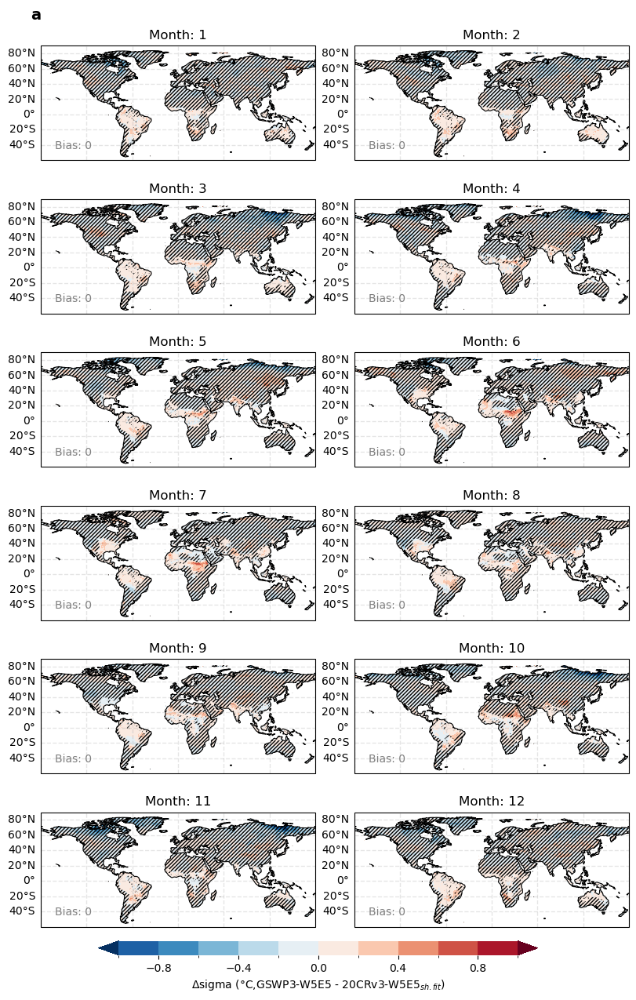

In [160]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=1
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params.isel(dataset=0).sel(params='sigma').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=2).sel(params='sigma').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    sig = np.abs(diff) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$sigma ($\degree$C,'+ f'{datasets[0]} - '+f'{datasets[2]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 

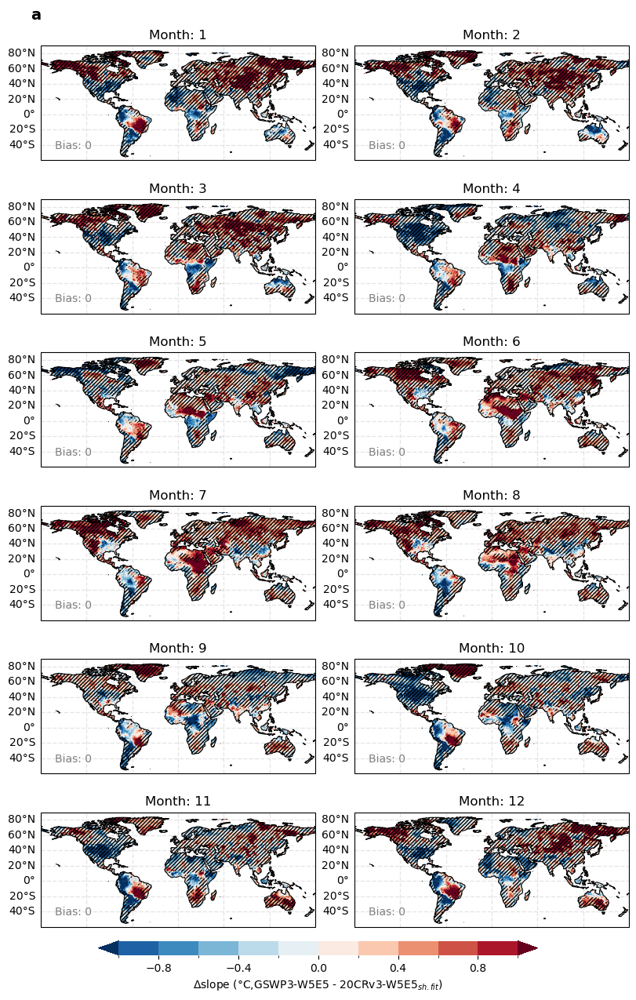

In [161]:
#import string
landmask = get_mask()

# Settings
proj = crs = ccrs.PlateCarree()
vmax=1
vmin=-vmax
levels = np.linspace(vmin, vmax, 11) # standard in fxn 

fig, axes = plt.subplots(6,2, figsize=(8,12),  layout='constrained',subplot_kw={'projection': crs})
axes = axes.flatten() 

dataset=0

for i, ax in enumerate( axes ):
    if i >= 12:
        break

    data1=da_params.isel(dataset=0).sel(params='b1').sel(month=i+1) # multi model mean
    data2=da_params.isel(dataset=2).sel(params='b1').sel(month=i+1)
    data_plot = ( data1 - data2 ) * landmask

    plot = plot_map_nAHD(data_plot,
                ax, 
                vmin=vmin, 
                vmax=vmax, 
                levels=levels, 
                skew=False, 
                title=False
                    )
    
    # stippling - delete this to have without significance assessment
    diff =da_nAHD_mo_mod_sf.mean(dim='dataset').sel(month=i+1) - da_nAHD_mo.isel(dataset=0).sel(month=i+1)
    sig = np.abs(diff) > 1
    # hatch = n.s.
    sig_inv = ~sig
    cont = ax.contourf(sig.lon, sig.lat, sig_inv.where(landmask==1,False).values, hatches=['', '///////'],  colors=['none'])

                    

    # calc statistics 
    #rmse= rmse_weighted(data1, data2, cellarea=cellarea, mask=True) 
    #mae = mae_weighted(data1, data2, cellarea=cellarea, mask=True) 
    bias= bias_weighted(data1, data2, cellarea=cellarea, mask=True) 

    ax.set_title(f'Month: {data1.month.values.item()}')
    ax.text(.05,.1, 
        #f"MAE: {int(mae.values.round(0))}\n"
        #f"RMSE: {int(rmse.values.round(0))}\n"
        f"Bias: {int(bias.values.round(2))}" ,
        transform=ax.transAxes,
        c='gray')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.2, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = False



# Colorbar
cax = fig.add_axes([0.15, -.01, 0.7, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
cbar.set_label('$\Delta$slope ($\degree$C,'+ f'{datasets[0]} - '+f'{datasets[2]}'+'$_{sh. fit}$)' )
cbar.outline.set_edgecolor('none')

fig.suptitle('a', fontweight='bold',x=0.05, fontsize=14);


# savefigs=True
# if savefigs:
#     plt.savefig(os.path.join(figdir,'figSImodeleval_nAHD_models_vs_reanalysis_hatchedmin5_long.png'),dpi=300)

# masked where difference is less than 1 day 